In [1]:
import json
import numpy as np
import pandas as pd
from pathlib import Path
import os
import sys
import warnings
from utils import *
import matplotlib.pyplot as plt
import seaborn as sns

warnings.simplefilter('ignore')

sys.path.append('../../utilities')
sys.path.append('../../models/grt123')
sys.path.append('../../models/grt123/training')
sys.path.append('../../models/grt123/preprocessing/')

# from layers import nms,iou
from summit_utils import SummitScan, xyz2irc
from evaluation import noduleCADEvaluation

workspace_path = Path(os.getcwd()).parent.parent


# Test Balanced Data

# Scan Metadata

In [2]:

from yaml import scan


def set_is_actionable(row):
    if row['radiology_report_management_plan_final'] in ['3_MONTH_FOLLOW_UP_SCAN','URGENT_REFERRAL', 'ALWAYS_SCAN_AT_YEAR_1']:
        return 'Actonable'
    else:
        return 'Non-Actionable'

def set_smoking_pack_years_cats(df):
    df[df['smoking_pack_years'] < 0] = np.nan
    return pd.qcut(df['smoking_pack_years'], 3, labels=['Low (15-35)', 'Medium (35-50)', 'High (50+)'])

person_data = pd.read_csv(
    f'{workspace_path}/data/summit/data/person_data.csv',
    usecols=['LDCT_RADIOLOGY_REPORT_main_participant_id', 'lung_health_check_clinical_smoking_pack_years', 'ocd_DeprivationScore_IMDRank']
).rename(columns={
    'lung_health_check_clinical_smoking_pack_years':'smoking_pack_years',
    'ocd_DeprivationScore_IMDRank':'deprivation_score'
}).assign(
    smoking_pack_years_cats=lambda df: set_smoking_pack_years_cats(df),
    IMDRank_tertile=lambda df: pd.qcut(df['deprivation_score'], 3, labels=['Low', 'Medium', 'High']),
    IMDRank_quintile=lambda df: pd.qcut(df['deprivation_score'], 5, labels=['Low', 'Low-Medium', 'Medium', 'Medium-High', 'High']),
)
                          
scan_metadata = (
    pd.read_csv(f'{workspace_path}/metadata/summit/balanced_female_for_inference/test_scans_metadata.csv')
    .assign(name=lambda df: df['LDCT_RADIOLOGY_REPORT_main_participant_id'] + '_Y0_BASELINE_A')
    .assign(is_actionable=lambda df: df.apply(set_is_actionable, axis=1))
    .assign(gender_is_actionable=lambda df: df.apply(set_gender_is_actionable, axis=1))    
    .assign(gender_is_not_actionable=lambda df: df.apply(set_gender_is_not_actionable, axis=1))    
    .assign(ethnic_group_is_actionable=lambda df: df.apply(set_ethnic_group_is_actionable, axis=1))    
    .assign(ethnic_group_is_not_actionable=lambda df: df.apply(set_ethnic_group_is_not_actionable, axis=1))    
    .rename(columns={
        'participant_details_gender':'gender',
        'lung_health_check_demographics_race_ethnicgroup':'ethnic_group'
    })
).merge(person_data, on='LDCT_RADIOLOGY_REPORT_main_participant_id')
scan_metadata = (
    scan_metadata
    .assign(smoking_pack_years_is_actionable=lambda df: df.apply(set_smoking_pack_years_is_actionable, axis=1))
    .assign(imdrank_is_actionable=lambda df: df.apply(set_imdrank_is_actionable, axis=1))    
)

## GRT123

NOT-UPPER       72
UPPER           68
NOT_ANSWERED    40
Name: nodule_site_combined, dtype: int64

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172


100%|██████████| 1000/1000 [00:08<00:00, 120.38it/s]


,0,159,476,1111,2381,4920,9999
0,0.14 (0.07 - 0.21),0.21 (0.14 - 0.29),0.31 (0.23 - 0.39),0.42 (0.32 - 0.51),0.59 (0.5 - 0.68),0.66 (0.58 - 0.74),0.75 (0.68 - 0.82)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.14,0.07,0.21
159,0.25,0.21,0.14,0.29
476,0.50,0.31,0.23,0.39
1111,1.00,0.42,0.32,0.51
2381,2.00,0.59,0.50,0.68
4920,4.00,0.66,0.58,0.74
9999,8.00,0.75,0.68,0.82


Mean Sensitivity: 0.44 Low Sensitivity: 0.36 High Sensitivity: 0.52


,True positives,146
0,False positives,7705.000
1,False negatives,34.000
2,True negatives,0.000
3,Total number of candidates,7852.000
4,Total number of nodules,180.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.811
8,Average number of candidates per scan,45.651


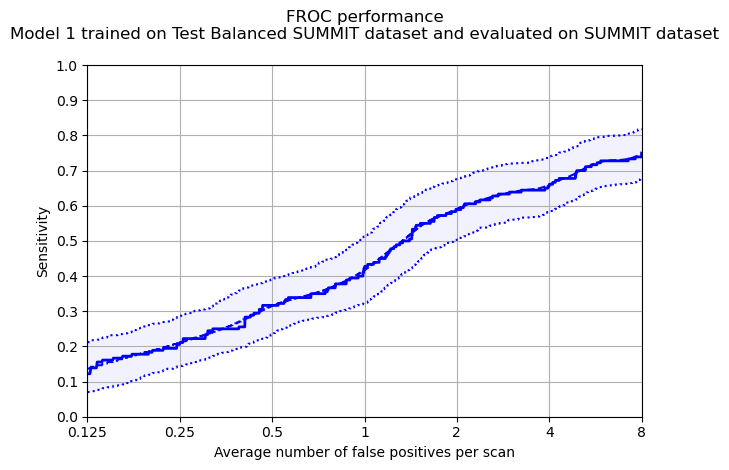

In [3]:
# Add in diameter cuts for later analysis
def combine_site(nodule_site):
    if nodule_site.find('UPPER') > -1:
        return 'UPPER'
    elif nodule_site.find('NOT') > -1:
        return 'NOT_ANSWERED'
    else:
        return 'NOT-UPPER'
    
def combine_site2(nodule_site):
    if nodule_site.find('RIGHT') > -1:
        return 'RIGHT'
    elif nodule_site.find('LEFT') > -1:
        return 'LEFT'
    else:
        return 'NOT_ANSWERED'

diameter_cats = [0, 4, 8, 15, 20, 30, 40, 999]
diameter_lbs = [f'{diameter_cats[i]:02}-{diameter_cats[i+1]:02}' for i in range(len(diameter_cats))[:-1]]

annotations = (
    pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv')
    .assign(diameter_cats=lambda df: 
        pd.cut(
            df['nodule_diameter_mm'], 
            bins=diameter_cats,
            labels=diameter_lbs
        )            
    )
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

display(annotations.nodule_site_combined.value_counts())

# save back to the metadata file
annotations.to_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv', index=False)
grt123_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/balanced_female_for_inference/test_scans.csv',
    results_filename=f"{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_predictions.csv",    
    filter='\nModel 1 trained on Test Balanced SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/froc_balanced_female_for_inference_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/CADAnalysis.txt')

### Gender analysis

Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,52.0,6.0,11.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp6_b3yh9z/annotations.csv
Total number of included nodule annotations: 179
Total number of nodule annotations: 179
Cases: 170


100%|██████████| 1000/1000 [00:08<00:00, 124.50it/s]


,0,159,476,1111,2381,4920,9999
0,0.14 (0.07 - 0.21),0.21 (0.13 - 0.28),0.31 (0.23 - 0.39),0.42 (0.32 - 0.52),0.59 (0.51 - 0.67),0.66 (0.58 - 0.73),0.74 (0.67 - 0.81)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.14,0.07,0.21
159,0.25,0.21,0.13,0.28
476,0.50,0.31,0.23,0.39
1111,1.00,0.42,0.32,0.52
2381,2.00,0.59,0.51,0.67
4920,4.00,0.66,0.58,0.73
9999,8.00,0.74,0.67,0.81


Mean Sensitivity: 0.44 Low Sensitivity: 0.36 High Sensitivity: 0.52


,True positives,145
0,False positives,7633.000
1,False negatives,34.000
2,True negatives,0.000
3,Total number of candidates,7779.000
4,Total number of nodules,179.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.810
8,Average number of candidates per scan,45.759


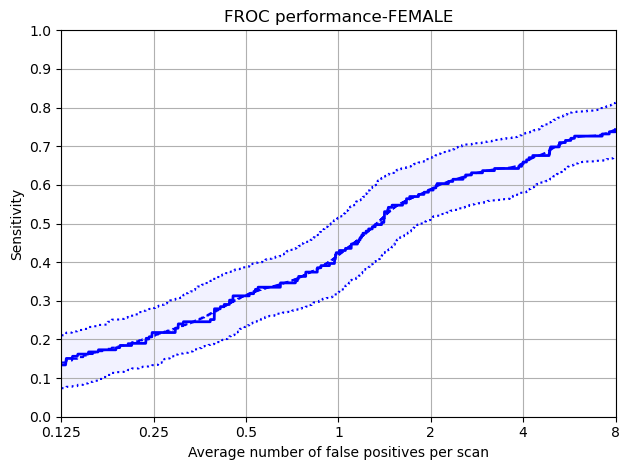

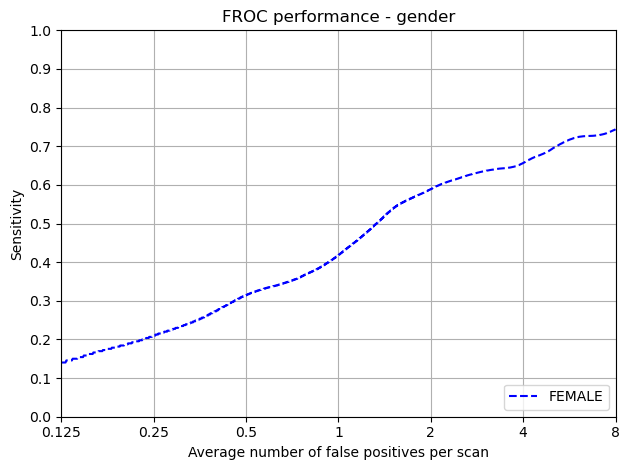

In [4]:

annotations_excluded = pd.read_csv(f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv')

annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv')

predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_predictions.csv')

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Ethnicity analysis

Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,64.0,5.0,2.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpanbfl35s/annotations.csv
Total number of included nodule annotations: 44
Total number of nodule annotations: 44
Cases: 56


100%|██████████| 1000/1000 [00:02<00:00, 388.03it/s]


,0,159,476,1111,2381,4920,9999
0,0.17 (0.02 - 0.37),0.31 (0.16 - 0.5),0.45 (0.28 - 0.65),0.65 (0.45 - 0.82),0.73 (0.55 - 0.85),0.79 (0.65 - 0.9),0.82 (0.69 - 0.92)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.17,0.02,0.37
159,0.25,0.31,0.16,0.50
476,0.50,0.45,0.28,0.65
1111,1.00,0.65,0.45,0.82
2381,2.00,0.73,0.55,0.85
4920,4.00,0.79,0.65,0.90
9999,8.00,0.82,0.69,0.92


Mean Sensitivity: 0.56 Low Sensitivity: 0.4 High Sensitivity: 0.72


,True positives,37
0,False positives,2342.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,2379.000
4,Total number of nodules,44.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.841
8,Average number of candidates per scan,42.482


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,47.0,6.0,12.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpj13cuxgl/annotations.csv
Total number of included nodule annotations: 78
Total number of nodule annotations: 78
Cases: 58


100%|██████████| 1000/1000 [00:03<00:00, 317.60it/s]


,0,159,476,1111,2381,4920,9999
0,0.18 (0.07 - 0.32),0.25 (0.12 - 0.37),0.33 (0.2 - 0.46),0.41 (0.28 - 0.55),0.55 (0.42 - 0.69),0.66 (0.53 - 0.79),0.75 (0.64 - 0.85)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.18,0.07,0.32
159,0.25,0.25,0.12,0.37
476,0.50,0.33,0.20,0.46
1111,1.00,0.41,0.28,0.55
2381,2.00,0.55,0.42,0.69
4920,4.00,0.66,0.53,0.79
9999,8.00,0.75,0.64,0.85


Mean Sensitivity: 0.45 Low Sensitivity: 0.32 High Sensitivity: 0.58


,True positives,64
0,False positives,2868.000
1,False negatives,14.000
2,True negatives,0.000
3,Total number of candidates,2933.000
4,Total number of nodules,78.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.821
8,Average number of candidates per scan,50.569


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,49.0,5.0,16.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_epmw2yh/annotations.csv
Total number of included nodule annotations: 57
Total number of nodule annotations: 57
Cases: 58


100%|██████████| 1000/1000 [00:02<00:00, 356.78it/s]


,0,159,476,1111,2381,4920,9999
0,0.12 (0.03 - 0.24),0.15 (0.05 - 0.27),0.2 (0.09 - 0.32),0.27 (0.16 - 0.41),0.49 (0.36 - 0.62),0.56 (0.43 - 0.68),0.7 (0.57 - 0.82)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.12,0.03,0.24
159,0.25,0.15,0.05,0.27
476,0.50,0.20,0.09,0.32
1111,1.00,0.27,0.16,0.41
2381,2.00,0.49,0.36,0.62
4920,4.00,0.56,0.43,0.68
9999,8.00,0.70,0.57,0.82


Mean Sensitivity: 0.36 Low Sensitivity: 0.24 High Sensitivity: 0.48


,True positives,44
0,False positives,2423.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,2467.000
4,Total number of nodules,57.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.772
8,Average number of candidates per scan,42.534


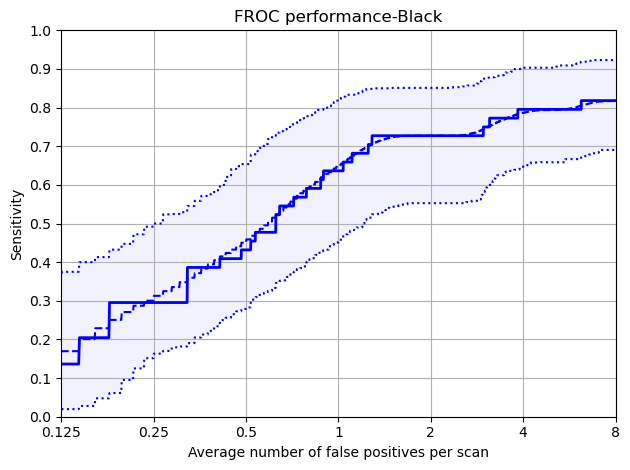

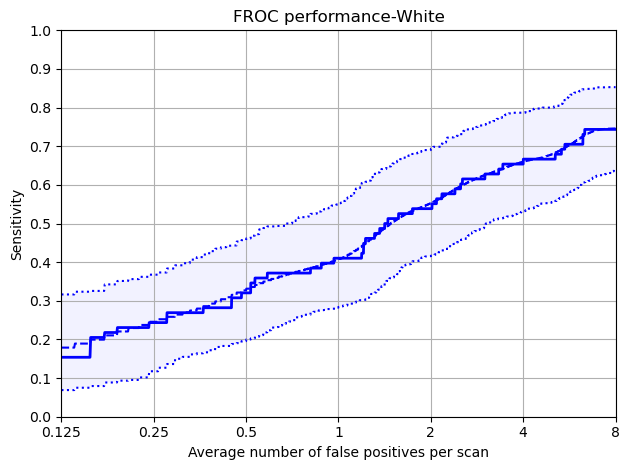

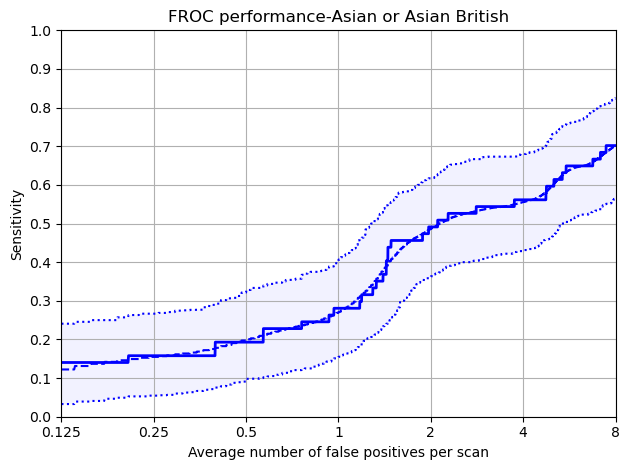

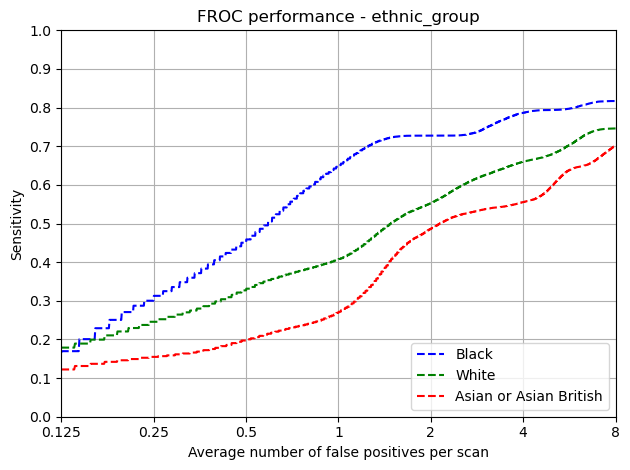

In [5]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### IMDRank_tertile

Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,40.0,5.0,19.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpljl9m6fm/annotations.csv
Total number of included nodule annotations: 42
Total number of nodule annotations: 42
Cases: 44


100%|██████████| 1000/1000 [00:02<00:00, 446.93it/s]


,0,159,476,1111,2381,4920,9999
0,0.16 (0.03 - 0.33),0.25 (0.08 - 0.46),0.36 (0.17 - 0.53),0.43 (0.29 - 0.61),0.5 (0.35 - 0.68),0.59 (0.45 - 0.74),0.65 (0.52 - 0.79)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.16,0.03,0.33
159,0.25,0.25,0.08,0.46
476,0.50,0.36,0.17,0.53
1111,1.00,0.43,0.29,0.61
2381,2.00,0.50,0.35,0.68
4920,4.00,0.59,0.45,0.74
9999,8.00,0.65,0.52,0.79


Mean Sensitivity: 0.42 Low Sensitivity: 0.27 High Sensitivity: 0.59


,True positives,30
0,False positives,1981.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,2011.000
4,Total number of nodules,42.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.714
8,Average number of candidates per scan,45.705


Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,43.0,8.0,13.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_2aslumt/annotations.csv
Total number of included nodule annotations: 60
Total number of nodule annotations: 60
Cases: 54


100%|██████████| 1000/1000 [00:02<00:00, 384.02it/s]


,0,159,476,1111,2381,4920,9999
0,0.09 (0.0 - 0.21),0.17 (0.06 - 0.31),0.25 (0.13 - 0.39),0.38 (0.22 - 0.54),0.57 (0.45 - 0.7),0.61 (0.48 - 0.73),0.71 (0.57 - 0.84)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.09,0.00,0.21
159,0.25,0.17,0.06,0.31
476,0.50,0.25,0.13,0.39
1111,1.00,0.38,0.22,0.54
2381,2.00,0.57,0.45,0.70
4920,4.00,0.61,0.48,0.73
9999,8.00,0.71,0.57,0.84


Mean Sensitivity: 0.4 Low Sensitivity: 0.27 High Sensitivity: 0.53


,True positives,47
0,False positives,2342.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,2390.000
4,Total number of nodules,60.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.783
8,Average number of candidates per scan,44.259


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,21.0,64.0,4.0,4.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpxuz_ojt9/annotations.csv
Total number of included nodule annotations: 75
Total number of nodule annotations: 75
Cases: 68


100%|██████████| 1000/1000 [00:03<00:00, 312.60it/s]


,0,159,476,1111,2381,4920,9999
0,0.18 (0.09 - 0.29),0.24 (0.14 - 0.35),0.33 (0.21 - 0.46),0.45 (0.31 - 0.61),0.65 (0.51 - 0.77),0.75 (0.62 - 0.85),0.81 (0.7 - 0.9)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.18,0.09,0.29
159,0.25,0.24,0.14,0.35
476,0.50,0.33,0.21,0.46
1111,1.00,0.45,0.31,0.61
2381,2.00,0.65,0.51,0.77
4920,4.00,0.75,0.62,0.85
9999,8.00,0.81,0.70,0.90


Mean Sensitivity: 0.49 Low Sensitivity: 0.37 High Sensitivity: 0.6


,True positives,66
0,False positives,3083.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,3149.000
4,Total number of nodules,75.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.880
8,Average number of candidates per scan,46.309


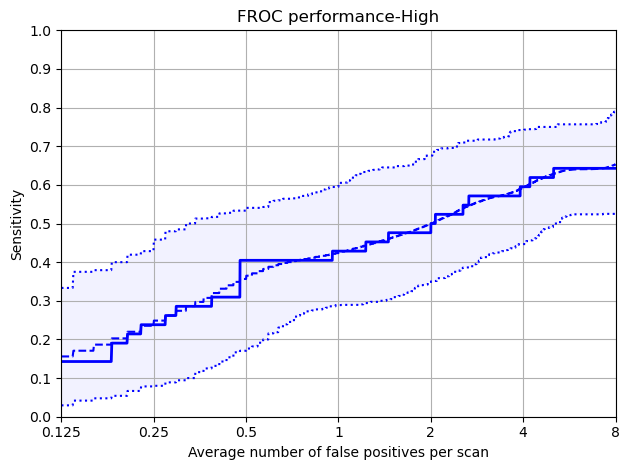

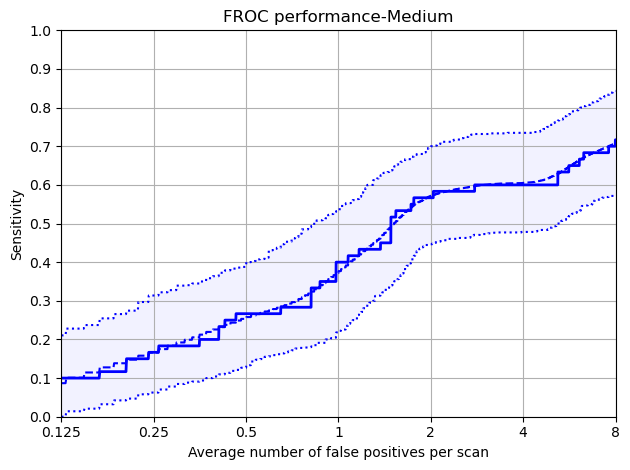

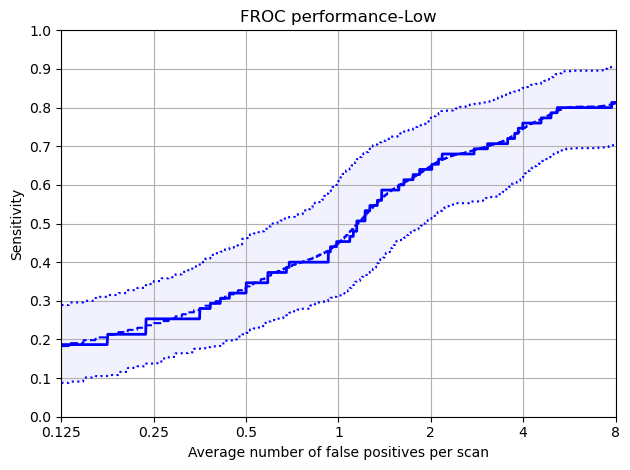

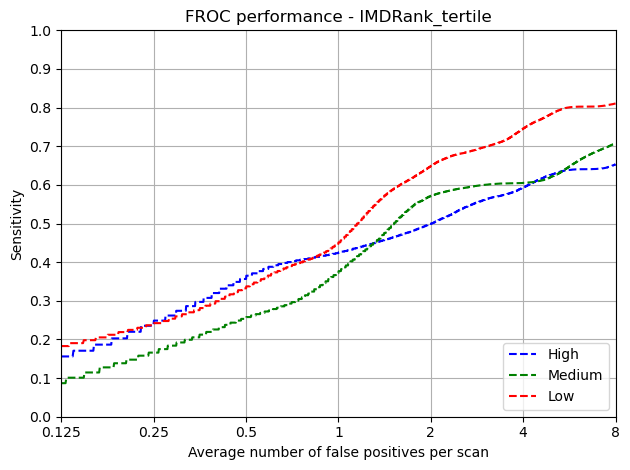

In [6]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Smoking Pack Years


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,52.0,5.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp8v5fniru/annotations.csv
Total number of included nodule annotations: 64
Total number of nodule annotations: 64
Cases: 64


100%|██████████| 1000/1000 [00:02<00:00, 355.89it/s]


,0,159,476,1111,2381,4920,9999
0,0.18 (0.07 - 0.31),0.25 (0.11 - 0.38),0.35 (0.18 - 0.5),0.43 (0.27 - 0.58),0.56 (0.41 - 0.69),0.66 (0.52 - 0.79),0.76 (0.62 - 0.89)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.18,0.07,0.31
159,0.25,0.25,0.11,0.38
476,0.50,0.35,0.18,0.50
1111,1.00,0.43,0.27,0.58
2381,2.00,0.56,0.41,0.69
4920,4.00,0.66,0.52,0.79
9999,8.00,0.76,0.62,0.89


Mean Sensitivity: 0.46 Low Sensitivity: 0.31 High Sensitivity: 0.59


,True positives,53
0,False positives,2678.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,2732.000
4,Total number of nodules,64.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.828
8,Average number of candidates per scan,42.688


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,63.0,4.0,7.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpde9dxul9/annotations.csv
Total number of included nodule annotations: 76
Total number of nodule annotations: 76
Cases: 77


100%|██████████| 1000/1000 [00:03<00:00, 270.88it/s]


,0,159,476,1111,2381,4920,9999
0,0.15 (0.04 - 0.28),0.25 (0.14 - 0.37),0.34 (0.23 - 0.46),0.52 (0.38 - 0.66),0.67 (0.56 - 0.77),0.72 (0.63 - 0.81),0.81 (0.71 - 0.89)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.15,0.04,0.28
159,0.25,0.25,0.14,0.37
476,0.50,0.34,0.23,0.46
1111,1.00,0.52,0.38,0.66
2381,2.00,0.67,0.56,0.77
4920,4.00,0.72,0.63,0.81
9999,8.00,0.81,0.71,0.89


Mean Sensitivity: 0.49 Low Sensitivity: 0.38 High Sensitivity: 0.61


,True positives,65
0,False positives,3621.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,3686.000
4,Total number of nodules,76.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.855
8,Average number of candidates per scan,47.870


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,15.0,31.0,10.0,28.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp4xmvp6aq/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 31


100%|██████████| 1000/1000 [00:01<00:00, 599.54it/s]


,0,159,476,1111,2381,4920,9999
0,0.1 (0.0 - 0.25),0.14 (0.03 - 0.27),0.19 (0.04 - 0.34),0.33 (0.13 - 0.58),0.51 (0.32 - 0.7),0.57 (0.38 - 0.75),0.6 (0.42 - 0.76)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.10,0.00,0.25
159,0.25,0.14,0.03,0.27
476,0.50,0.19,0.04,0.34
1111,1.00,0.33,0.13,0.58
2381,2.00,0.51,0.32,0.70
4920,4.00,0.57,0.38,0.75
9999,8.00,0.60,0.42,0.76


Mean Sensitivity: 0.35 Low Sensitivity: 0.19 High Sensitivity: 0.52


,True positives,27
0,False positives,1334.000
1,False negatives,12.000
2,True negatives,0.000
3,Total number of candidates,1361.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.692
8,Average number of candidates per scan,43.903


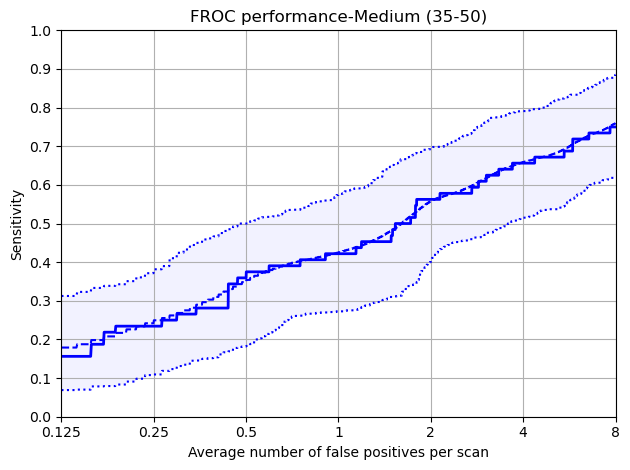

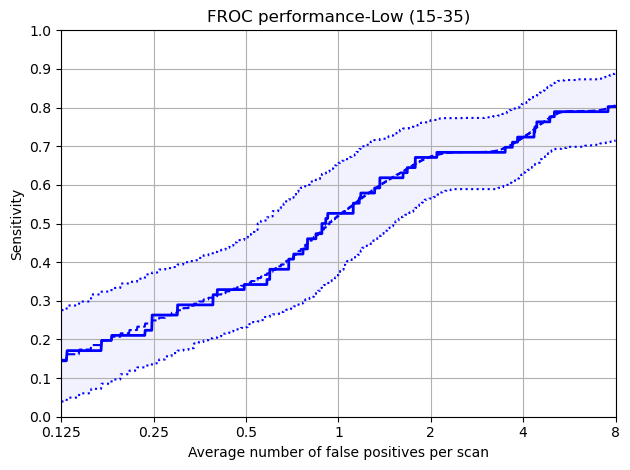

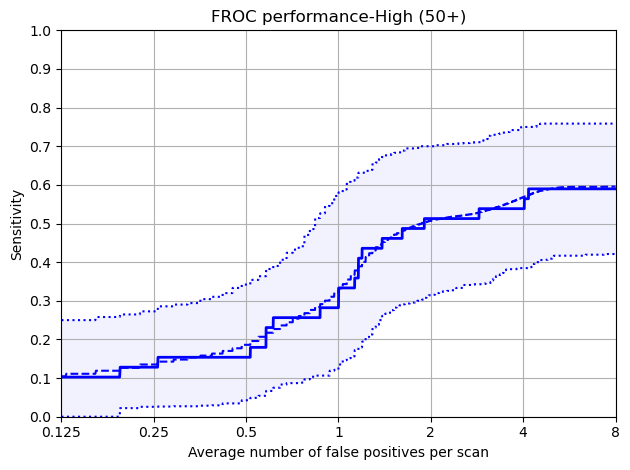

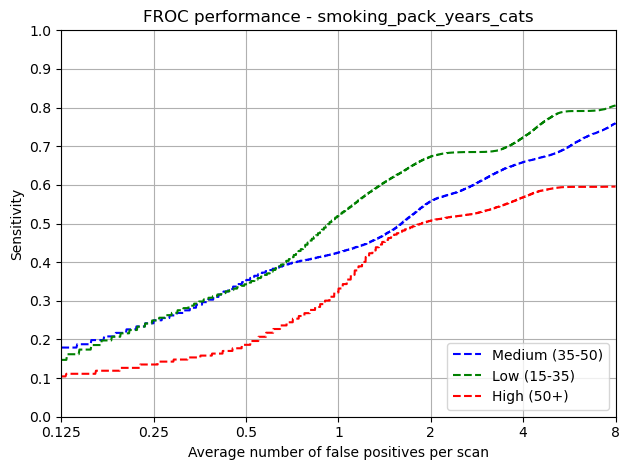

In [7]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpjl25bcca/annotations.csv
Total number of included nodule annotations: 84
Total number of nodule annotations: 84
Cases: 125


100%|██████████| 1000/1000 [00:06<00:00, 163.39it/s]


,0,159,476,1111,2381,4920,9999
0,0.21 (0.09 - 0.34),0.32 (0.2 - 0.43),0.42 (0.31 - 0.53),0.53 (0.4 - 0.65),0.65 (0.54 - 0.76),0.72 (0.6 - 0.82),0.84 (0.75 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.21,0.09,0.34
159,0.25,0.32,0.20,0.43
476,0.50,0.42,0.31,0.53
1111,1.00,0.53,0.40,0.65
2381,2.00,0.65,0.54,0.76
4920,4.00,0.72,0.60,0.82
9999,8.00,0.84,0.75,0.93


Mean Sensitivity: 0.53 Low Sensitivity: 0.41 High Sensitivity: 0.64


,True positives,75
0,False positives,5445.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,5520.000
4,Total number of nodules,84.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.893
8,Average number of candidates per scan,44.160


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,26.0,11.0,18.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpbag62rv9/annotations.csv
Total number of included nodule annotations: 95
Total number of nodule annotations: 95
Cases: 46


100%|██████████| 1000/1000 [00:02<00:00, 407.42it/s]


,0,159,476,1111,2381,4920,9999
0,0.08 (0.03 - 0.15),0.11 (0.05 - 0.19),0.19 (0.09 - 0.31),0.31 (0.2 - 0.43),0.52 (0.39 - 0.65),0.59 (0.48 - 0.7),0.65 (0.55 - 0.76)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.08,0.03,0.15
159,0.25,0.11,0.05,0.19
476,0.50,0.19,0.09,0.31
1111,1.00,0.31,0.20,0.43
2381,2.00,0.52,0.39,0.65
4920,4.00,0.59,0.48,0.70
9999,8.00,0.65,0.55,0.76


Mean Sensitivity: 0.35 Low Sensitivity: 0.26 High Sensitivity: 0.46


,True positives,70
0,False positives,2188.000
1,False negatives,25.000
2,True negatives,0.000
3,Total number of candidates,2259.000
4,Total number of nodules,95.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.737
8,Average number of candidates per scan,49.109


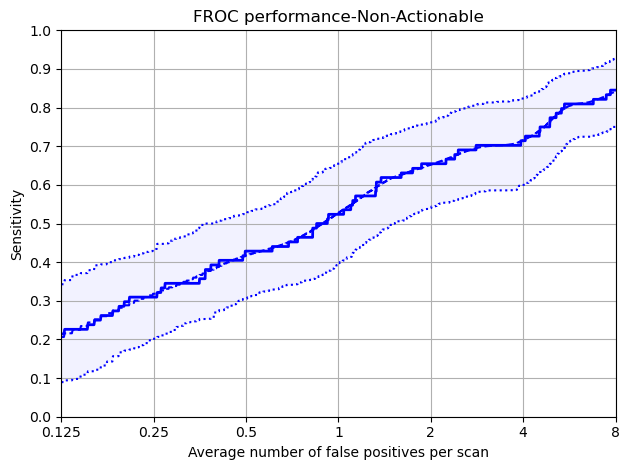

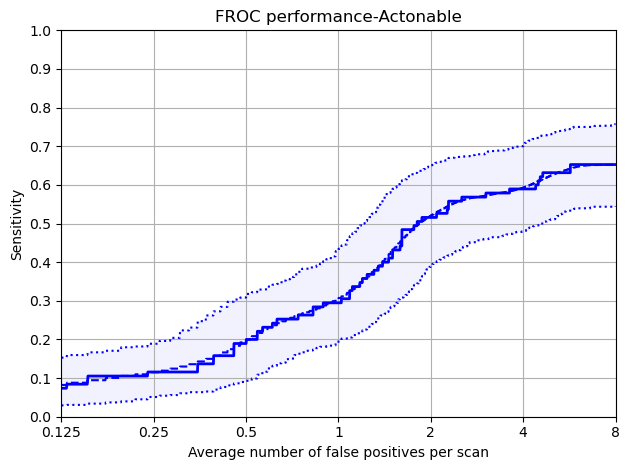

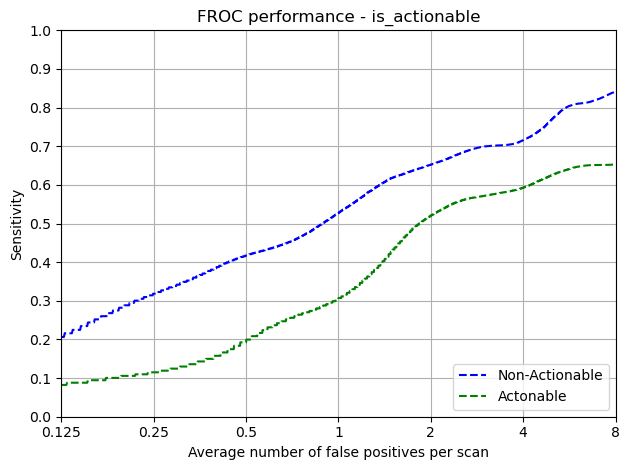

In [8]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable-Gender Splits

Protected Group: Female_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,26.0,11.0,18.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5trk00xf/annotations.csv
Total number of included nodule annotations: 95
Total number of nodule annotations: 95
Cases: 46


100%|██████████| 1000/1000 [00:02<00:00, 410.45it/s]


,0,159,476,1111,2381,4920,9999
0,0.08 (0.03 - 0.14),0.12 (0.06 - 0.19),0.2 (0.1 - 0.31),0.31 (0.21 - 0.44),0.53 (0.4 - 0.66),0.6 (0.49 - 0.71),0.66 (0.55 - 0.76)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.08,0.03,0.14
159,0.25,0.12,0.06,0.19
476,0.50,0.20,0.10,0.31
1111,1.00,0.31,0.21,0.44
2381,2.00,0.53,0.40,0.66
4920,4.00,0.60,0.49,0.71
9999,8.00,0.66,0.55,0.76


Mean Sensitivity: 0.36 Low Sensitivity: 0.26 High Sensitivity: 0.46


,True positives,70
0,False positives,2188.000
1,False negatives,25.000
2,True negatives,0.000
3,Total number of candidates,2259.000
4,Total number of nodules,95.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.737
8,Average number of candidates per scan,49.109


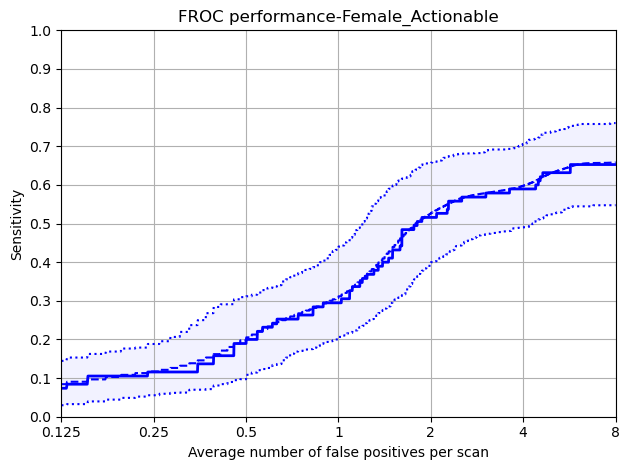

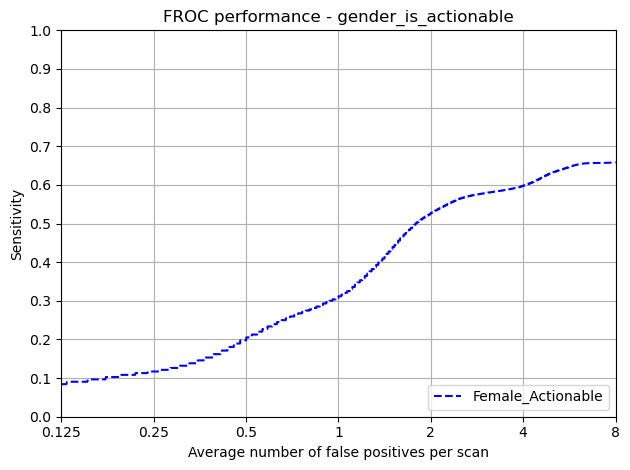

In [9]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### NonActionable-Gender

Protected Group: Female_Non_Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpp2_s_0mw/annotations.csv
Total number of included nodule annotations: 84
Total number of nodule annotations: 84
Cases: 125


100%|██████████| 1000/1000 [00:05<00:00, 174.36it/s]


,0,159,476,1111,2381,4920,9999
0,0.21 (0.09 - 0.33),0.32 (0.21 - 0.44),0.41 (0.3 - 0.53),0.53 (0.39 - 0.65),0.65 (0.54 - 0.76),0.72 (0.61 - 0.82),0.84 (0.76 - 0.92)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.21,0.09,0.33
159,0.25,0.32,0.21,0.44
476,0.50,0.41,0.30,0.53
1111,1.00,0.53,0.39,0.65
2381,2.00,0.65,0.54,0.76
4920,4.00,0.72,0.61,0.82
9999,8.00,0.84,0.76,0.92


Mean Sensitivity: 0.53 Low Sensitivity: 0.41 High Sensitivity: 0.64


,True positives,75
0,False positives,5445.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,5520.000
4,Total number of nodules,84.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.893
8,Average number of candidates per scan,44.160


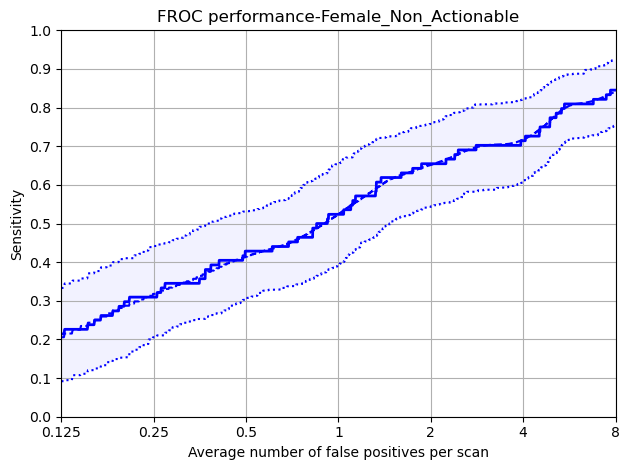

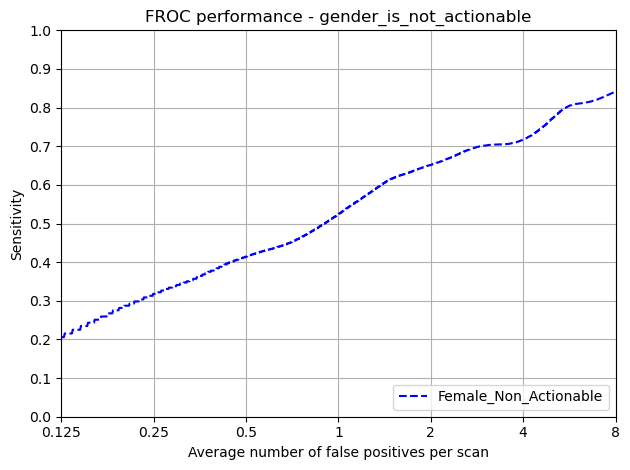

In [10]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable Ethnic Group

Protected Group: White_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,27.0,11.0,18.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp5e6q3z6l/annotations.csv
Total number of included nodule annotations: 44
Total number of nodule annotations: 44
Cases: 18


100%|██████████| 1000/1000 [00:01<00:00, 738.05it/s]


,0,159,476,1111,2381,4920,9999
0,0.14 (0.02 - 0.27),0.19 (0.06 - 0.35),0.27 (0.11 - 0.46),0.37 (0.2 - 0.58),0.55 (0.36 - 0.76),0.63 (0.48 - 0.8),0.7 (0.57 - 0.84)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.14,0.02,0.27
159,0.25,0.19,0.06,0.35
476,0.50,0.27,0.11,0.46
1111,1.00,0.37,0.20,0.58
2381,2.00,0.55,0.36,0.76
4920,4.00,0.63,0.48,0.80
9999,8.00,0.70,0.57,0.84


Mean Sensitivity: 0.41 Low Sensitivity: 0.26 High Sensitivity: 0.58


,True positives,33
0,False positives,921.000
1,False negatives,11.000
2,True negatives,0.000
3,Total number of candidates,955.000
4,Total number of nodules,44.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.750
8,Average number of candidates per scan,53.056


Protected Group: Asian_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,22.0,9.0,25.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpc2dr6r1a/annotations.csv
Total number of included nodule annotations: 32
Total number of nodule annotations: 32
Cases: 19


100%|██████████| 1000/1000 [00:01<00:00, 786.70it/s]


,0,159,476,1111,2381,4920,9999
0,0.03 (0.0 - 0.12),0.04 (0.0 - 0.14),0.09 (0.0 - 0.19),0.16 (0.04 - 0.29),0.4 (0.21 - 0.58),0.49 (0.32 - 0.66),0.54 (0.37 - 0.71)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.03,0.00,0.12
159,0.25,0.04,0.00,0.14
476,0.50,0.09,0.00,0.19
1111,1.00,0.16,0.04,0.29
2381,2.00,0.40,0.21,0.58
4920,4.00,0.49,0.32,0.66
9999,8.00,0.54,0.37,0.71


Mean Sensitivity: 0.25 Low Sensitivity: 0.13 High Sensitivity: 0.38


,True positives,22
0,False positives,826.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,848.000
4,Total number of nodules,32.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.688
8,Average number of candidates per scan,44.632


Protected Group: Black_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,32.0,11.0,5.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmph_90n8wh/annotations.csv
Total number of included nodule annotations: 19
Total number of nodule annotations: 19
Cases: 11


100%|██████████| 1000/1000 [00:00<00:00, 1041.65it/s]


,0,159,476,1111,2381,4920,9999
0,0.16 (0.0 - 0.52),0.2 (0.0 - 0.64),0.38 (0.04 - 0.78),0.56 (0.22 - 0.85),0.62 (0.29 - 0.86),0.75 (0.46 - 1.0),0.78 (0.5 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.16,0.00,0.52
159,0.25,0.20,0.00,0.64
476,0.50,0.38,0.04,0.78
1111,1.00,0.56,0.22,0.85
2381,2.00,0.62,0.29,0.86
4920,4.00,0.75,0.46,1.00
9999,8.00,0.78,0.50,1.00


Mean Sensitivity: 0.49 Low Sensitivity: 0.22 High Sensitivity: 0.81


,True positives,15
0,False positives,441.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,456.000
4,Total number of nodules,19.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.789
8,Average number of candidates per scan,41.455


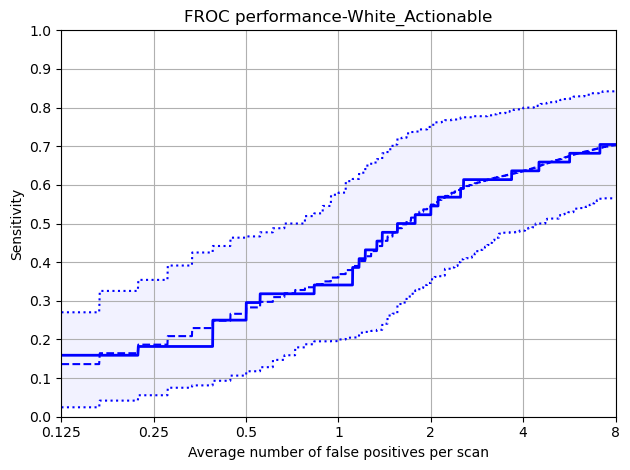

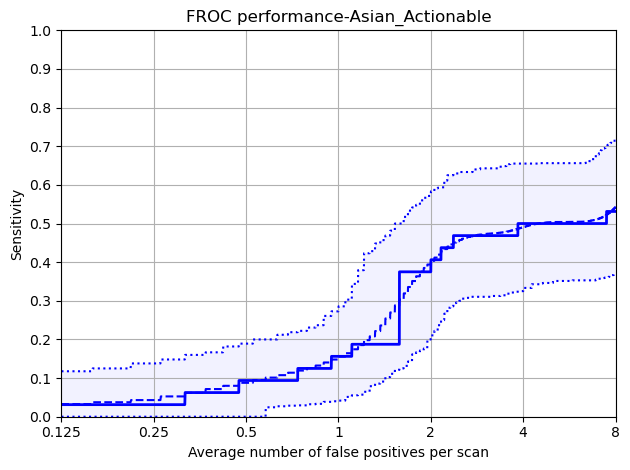

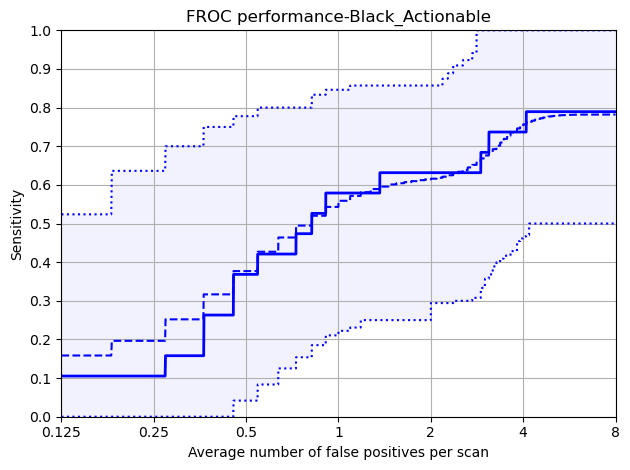

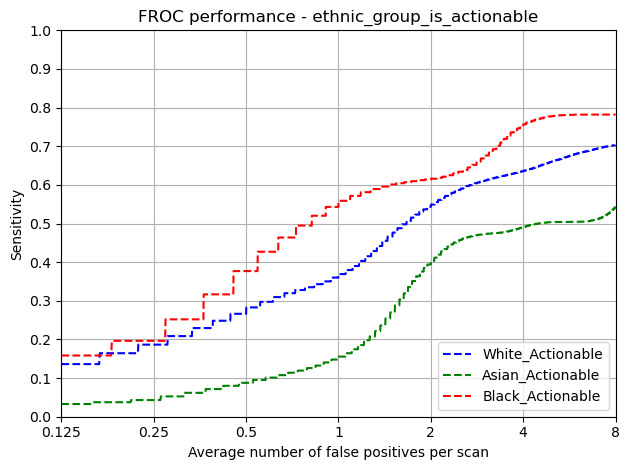

In [11]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### NonActionable Ethnic Group

Protected Group: Black_Non_Actionable


,SOLID,PERIFISSURAL
nodule_type,12.0,88.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqw4_npp1/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 46


100%|██████████| 1000/1000 [00:02<00:00, 454.13it/s]


,0,159,476,1111,2381,4920,9999
0,0.19 (0.0 - 0.42),0.36 (0.16 - 0.56),0.52 (0.35 - 0.74),0.71 (0.48 - 0.91),0.8 (0.65 - 0.93),0.8 (0.65 - 0.93),0.84 (0.67 - 0.96)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.19,0.00,0.42
159,0.25,0.36,0.16,0.56
476,0.50,0.52,0.35,0.74
1111,1.00,0.71,0.48,0.91
2381,2.00,0.80,0.65,0.93
4920,4.00,0.80,0.65,0.93
9999,8.00,0.84,0.67,0.96


Mean Sensitivity: 0.6 Low Sensitivity: 0.42 High Sensitivity: 0.78


,True positives,22
0,False positives,1901.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,1923.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.880
8,Average number of candidates per scan,41.804


Protected Group: White_Non_Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,24.0,74.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp1h5ies0z/annotations.csv
Total number of included nodule annotations: 34
Total number of nodule annotations: 34
Cases: 41


100%|██████████| 1000/1000 [00:02<00:00, 437.27it/s]


,0,159,476,1111,2381,4920,9999
0,0.26 (0.08 - 0.46),0.33 (0.13 - 0.53),0.41 (0.25 - 0.59),0.49 (0.3 - 0.68),0.57 (0.4 - 0.76),0.67 (0.47 - 0.87),0.8 (0.63 - 0.95)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.26,0.08,0.46
159,0.25,0.33,0.13,0.53
476,0.50,0.41,0.25,0.59
1111,1.00,0.49,0.30,0.68
2381,2.00,0.57,0.40,0.76
4920,4.00,0.67,0.47,0.87
9999,8.00,0.80,0.63,0.95


Mean Sensitivity: 0.5 Low Sensitivity: 0.32 High Sensitivity: 0.69


,True positives,31
0,False positives,1947.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,1978.000
4,Total number of nodules,34.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.912
8,Average number of candidates per scan,48.244


Protected Group: Asian_Non_Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,12.0,84.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmparlnoj5z/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 40


100%|██████████| 1000/1000 [00:01<00:00, 517.64it/s]


,0,159,476,1111,2381,4920,9999
0,0.27 (0.09 - 0.48),0.28 (0.1 - 0.5),0.34 (0.14 - 0.56),0.43 (0.21 - 0.65),0.58 (0.38 - 0.79),0.65 (0.47 - 0.85),0.87 (0.73 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.27,0.09,0.48
159,0.25,0.28,0.10,0.50
476,0.50,0.34,0.14,0.56
1111,1.00,0.43,0.21,0.65
2381,2.00,0.58,0.38,0.79
4920,4.00,0.65,0.47,0.85
9999,8.00,0.87,0.73,1.00


Mean Sensitivity: 0.49 Low Sensitivity: 0.3 High Sensitivity: 0.69


,True positives,22
0,False positives,1597.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,1619.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.880
8,Average number of candidates per scan,40.475


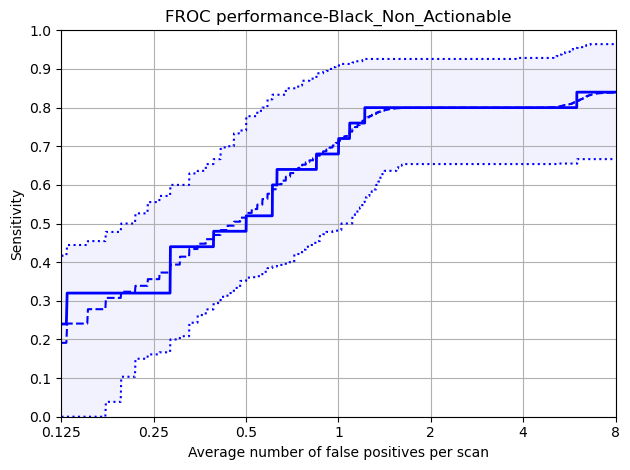

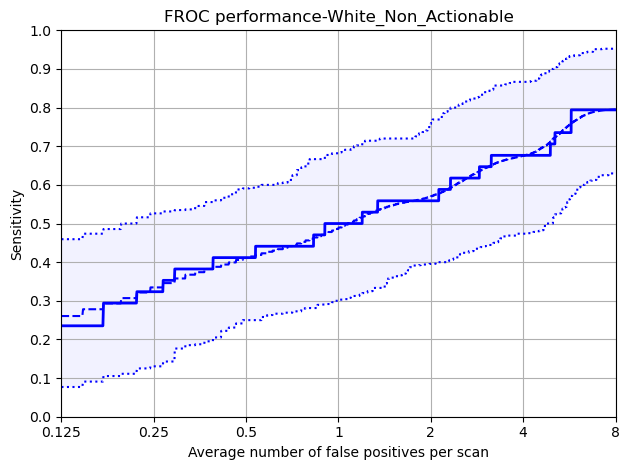

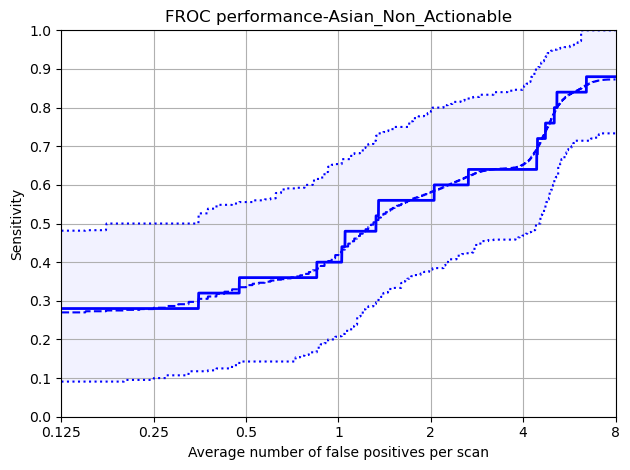

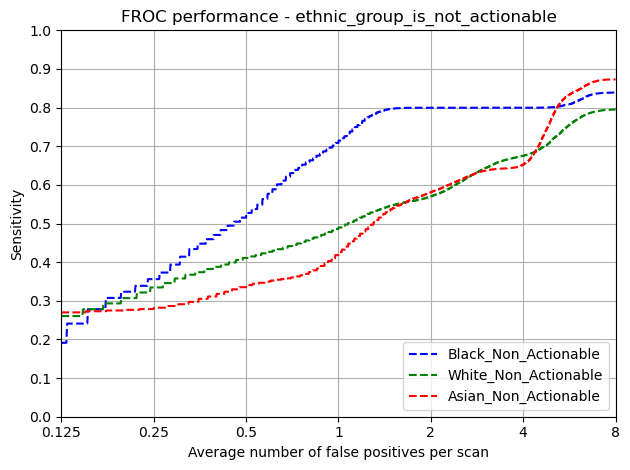

In [12]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable IMDRank

Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,13.0,16.0,26.0,23.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmph37ctqsx/annotations.csv
Total number of included nodule annotations: 31
Total number of nodule annotations: 31
Cases: 18


100%|██████████| 1000/1000 [00:01<00:00, 834.97it/s]


,0,159,476,1111,2381,4920,9999
0,0.03 (0.0 - 0.11),0.04 (0.0 - 0.13),0.09 (0.0 - 0.32),0.25 (0.07 - 0.47),0.5 (0.28 - 0.7),0.56 (0.4 - 0.73),0.6 (0.42 - 0.79)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.03,0.00,0.11
159,0.25,0.04,0.00,0.13
476,0.50,0.09,0.00,0.32
1111,1.00,0.25,0.07,0.47
2381,2.00,0.50,0.28,0.70
4920,4.00,0.56,0.40,0.73
9999,8.00,0.60,0.42,0.79


Mean Sensitivity: 0.3 Low Sensitivity: 0.17 High Sensitivity: 0.46


,True positives,23
0,False positives,809.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,833.000
4,Total number of nodules,31.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.742
8,Average number of candidates per scan,46.278


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,41.0,8.0,5.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpphaibj4t/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 19


100%|██████████| 1000/1000 [00:01<00:00, 818.07it/s]


,0,159,476,1111,2381,4920,9999
0,0.09 (0.0 - 0.26),0.14 (0.02 - 0.31),0.25 (0.08 - 0.43),0.43 (0.16 - 0.74),0.66 (0.45 - 0.83),0.74 (0.55 - 0.88),0.77 (0.59 - 0.9)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.09,0.00,0.26
159,0.25,0.14,0.02,0.31
476,0.50,0.25,0.08,0.43
1111,1.00,0.43,0.16,0.74
2381,2.00,0.66,0.45,0.83
4920,4.00,0.74,0.55,0.88
9999,8.00,0.77,0.59,0.90


Mean Sensitivity: 0.44 Low Sensitivity: 0.26 High Sensitivity: 0.62


,True positives,31
0,False positives,843.000
1,False negatives,8.000
2,True negatives,0.000
3,Total number of candidates,874.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.795
8,Average number of candidates per scan,46.000


Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,20.0,8.0,28.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpv7ao1bqp/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 11


100%|██████████| 1000/1000 [00:01<00:00, 999.07it/s]


,0,159,476,1111,2381,4920,9999
0,0.18 (0.04 - 0.35),0.23 (0.07 - 0.4),0.32 (0.19 - 0.48),0.35 (0.21 - 0.58),0.39 (0.22 - 0.64),0.47 (0.28 - 0.68),0.56 (0.43 - 0.71)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.18,0.04,0.35
159,0.25,0.23,0.07,0.40
476,0.50,0.32,0.19,0.48
1111,1.00,0.35,0.21,0.58
2381,2.00,0.39,0.22,0.64
4920,4.00,0.47,0.28,0.68
9999,8.00,0.56,0.43,0.71


Mean Sensitivity: 0.36 Low Sensitivity: 0.21 High Sensitivity: 0.55


,True positives,16
0,False positives,536.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,552.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.640
8,Average number of candidates per scan,50.182


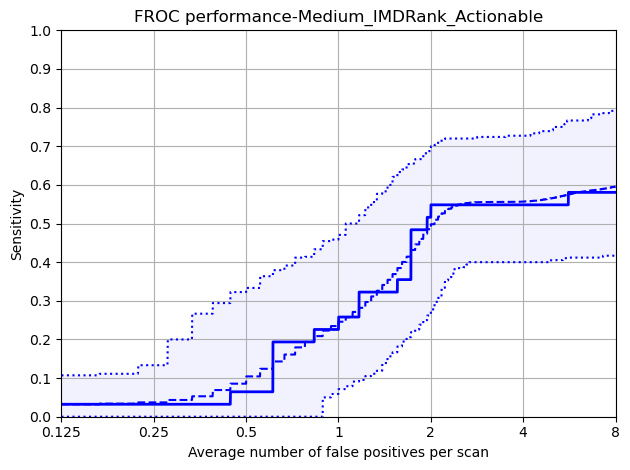

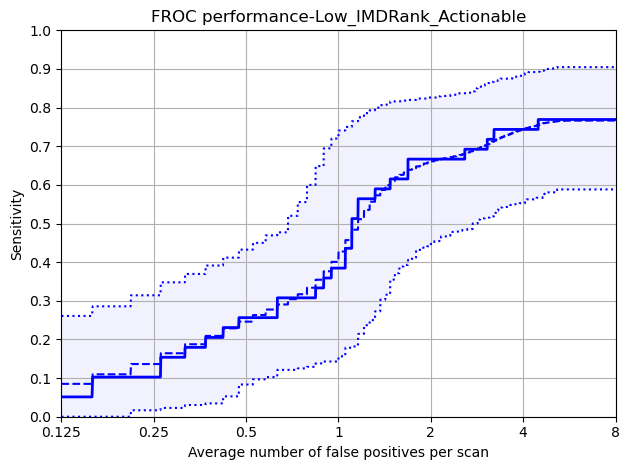

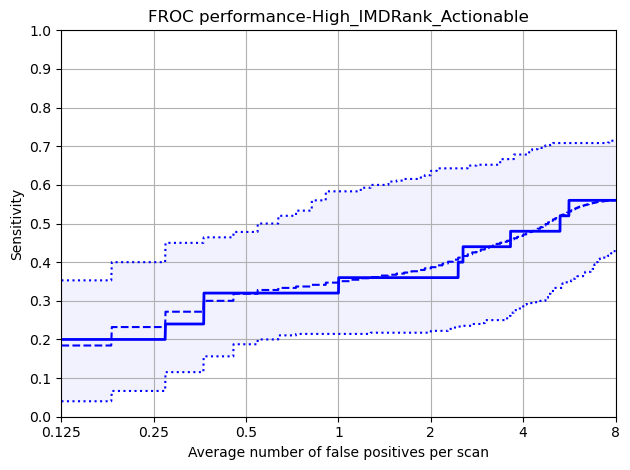

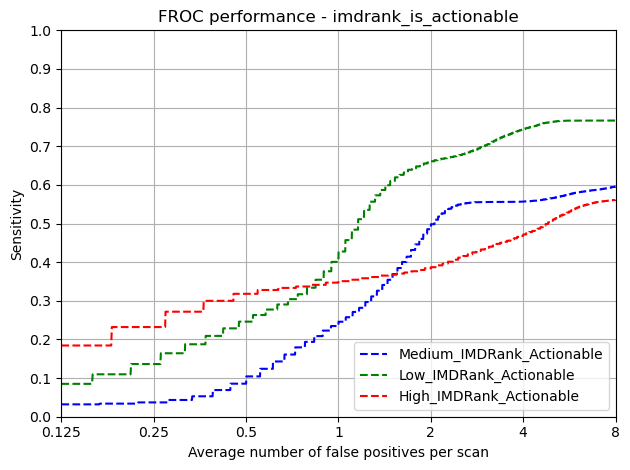

In [13]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,40.0,33.0,10.0,10.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp_f7p8d59/annotations.csv
Total number of included nodule annotations: 30
Total number of nodule annotations: 30
Cases: 15


100%|██████████| 1000/1000 [00:01<00:00, 909.16it/s]


,0,159,476,1111,2381,4920,9999
0,0.08 (0.0 - 0.22),0.12 (0.0 - 0.35),0.25 (0.04 - 0.48),0.45 (0.23 - 0.67),0.67 (0.5 - 0.78),0.73 (0.62 - 0.84),0.77 (0.65 - 0.87)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.08,0.00,0.22
159,0.25,0.12,0.00,0.35
476,0.50,0.25,0.04,0.48
1111,1.00,0.45,0.23,0.67
2381,2.00,0.67,0.50,0.78
4920,4.00,0.73,0.62,0.84
9999,8.00,0.77,0.65,0.87


Mean Sensitivity: 0.44 Low Sensitivity: 0.29 High Sensitivity: 0.6


,True positives,24
0,False positives,702.0
1,False negatives,6.0
2,True negatives,0.0
3,Total number of candidates,726.0
4,Total number of nodules,30.0
5,Ignored candidates on excluded nodules,0.0
6,Ignored candidates which were double detec...,0.0
7,Sensitivity,0.8
8,Average number of candidates per scan,48.4


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,29.0,9.0,9.0,18.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpbgtnsdld/annotations.csv
Total number of included nodule annotations: 34
Total number of nodule annotations: 34
Cases: 20


100%|██████████| 1000/1000 [00:01<00:00, 812.80it/s]


,0,159,476,1111,2381,4920,9999
0,0.12 (0.0 - 0.26),0.18 (0.06 - 0.36),0.24 (0.09 - 0.42),0.34 (0.19 - 0.54),0.48 (0.25 - 0.67),0.55 (0.36 - 0.74),0.63 (0.44 - 0.83)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.12,0.00,0.26
159,0.25,0.18,0.06,0.36
476,0.50,0.24,0.09,0.42
1111,1.00,0.34,0.19,0.54
2381,2.00,0.48,0.25,0.67
4920,4.00,0.55,0.36,0.74
9999,8.00,0.63,0.44,0.83


Mean Sensitivity: 0.36 Low Sensitivity: 0.2 High Sensitivity: 0.55


,True positives,25
0,False positives,845.000
1,False negatives,9.000
2,True negatives,0.000
3,Total number of candidates,871.000
4,Total number of nodules,34.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,1.000
7,Sensitivity,0.735
8,Average number of candidates per scan,43.550


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,16.0,16.0,13.0,35.0,19.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpk4naggeq/annotations.csv
Total number of included nodule annotations: 31
Total number of nodule annotations: 31
Cases: 13


100%|██████████| 1000/1000 [00:01<00:00, 954.48it/s]


,0,159,476,1111,2381,4920,9999
0,0.06 (0.0 - 0.17),0.1 (0.0 - 0.24),0.15 (0.03 - 0.32),0.24 (0.06 - 0.58),0.45 (0.24 - 0.71),0.51 (0.31 - 0.74),0.58 (0.39 - 0.78)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.06,0.00,0.17
159,0.25,0.10,0.00,0.24
476,0.50,0.15,0.03,0.32
1111,1.00,0.24,0.06,0.58
2381,2.00,0.45,0.24,0.71
4920,4.00,0.51,0.31,0.74
9999,8.00,0.58,0.39,0.78


Mean Sensitivity: 0.3 Low Sensitivity: 0.15 High Sensitivity: 0.51


,True positives,21
0,False positives,641.000
1,False negatives,10.000
2,True negatives,0.000
3,Total number of candidates,662.000
4,Total number of nodules,31.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,0.000
7,Sensitivity,0.677
8,Average number of candidates per scan,50.923


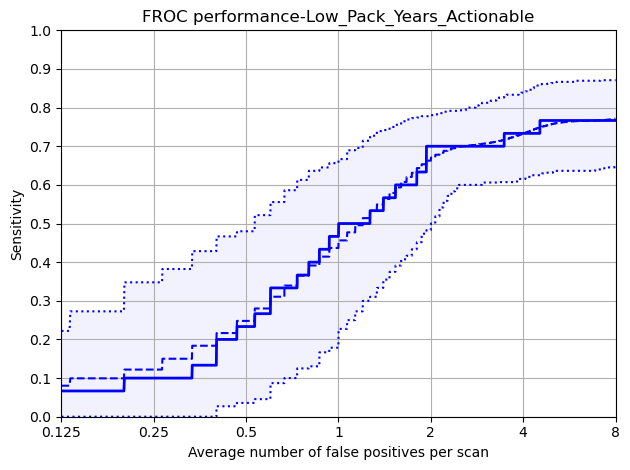

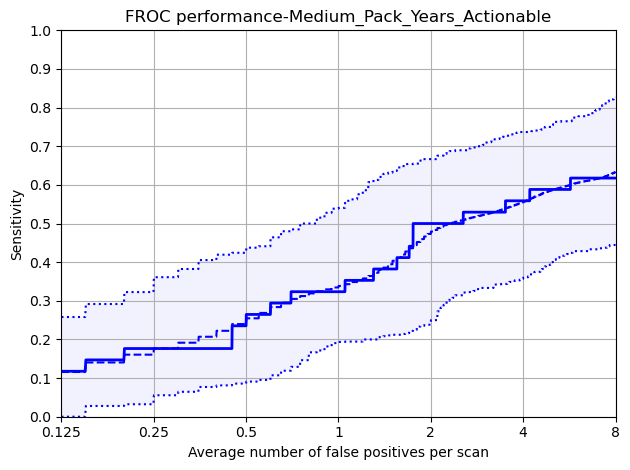

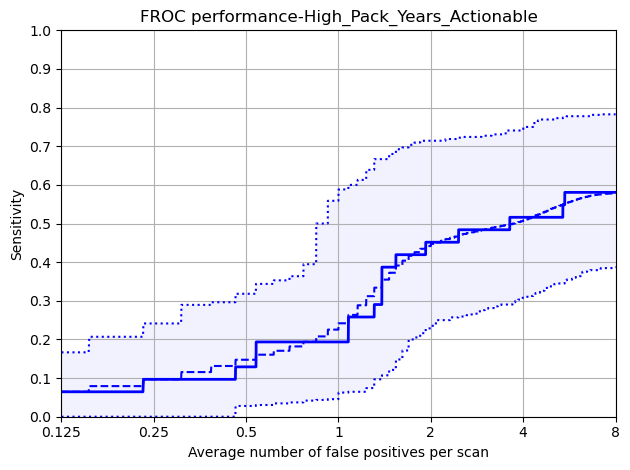

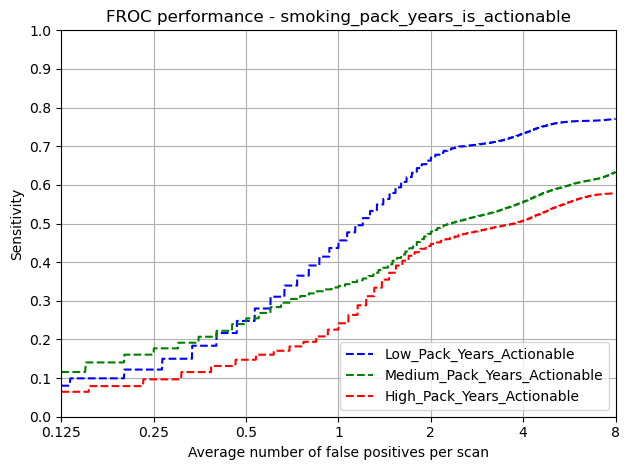

In [14]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/grt123/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### False positive and Miss Investigations

In [15]:
import importlib
import utils

importlib.reload(utils)

<module 'utils' from '/Users/john/Projects/SOTAEvaluationNoduleDetection/notebooks/FairnessInNoduleDetectionAlgorithms/utils.py'>

In [16]:
thresholds = utils.get_thresholds(grt123_summit_summit)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='grt123',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/balanced_female_for_inference/test_scans.csv',
    annotations_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/grt123_annotations_excluded_empty.csv',
    predictions_path=f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_predictions.csv',
    thresholds=thresholds
)


/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 7.1617875 FPPs: 159
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 6.8667235 FPPs: 143
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 6.406053 FPPs: 123
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/g

#### Incremental FROC Scores - Gender/ Ethnic Group/ Nodule Type

In [17]:

hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)


In [18]:


recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    pass

    recode_dict[idx] = hmm

df = pd.DataFrame.from_dict(recode_dict, orient='index')

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** {type} ***')
    group1 = f'all_White_{type}_Hits%'
    group2 = f'all_Asian or Asian British_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 0, all, MALE, SOLID
Error: 0, all, MALE, NON_SOLID
Error: 0, all, MALE, PART_SOLID
Error: 0, all, MALE, PERIFISSURAL
Error: 0, all, MALE, CALCIFIED
Error: 0, all, FEMALE, NON_SOLID
Error: 0, all, FEMALE, PART_SOLID
Error: 0, all, FEMALE, CALCIFIED
Error: 0, all, All, NON_SOLID
Error: 0, all, All, PART_SOLID
Error: 0, all, All, CALCIFIED
Error: 0, all, Asian or Asian British, NON_SOLID
Error: 0, all, Asian or Asian British, PART_SOLID
Error: 0, all, Asian or Asian British, CALCIFIED
Error: 0, all, Black, NON_SOLID
Error: 0, all, Black, PART_SOLID
Error: 0, all, Black, CALCIFIED
Error: 0, all, White, NON_SOLID
Error: 0, all, White, PART_SOLID
Error: 0, all, White, CALCIFIED
Error: 0, actionable, MALE, SOLID
Error: 0, actionable, MALE, NON_SOLID
Error: 0, actionable, MALE, PART_SOLID
Error: 0, actionable, MALE, PERIFISSURAL
Error: 0, actionable, MALE, CALCIFIED
Error: 0, actionable, FEMALE, NON_SOLID
Error: 0, actionable, FEMALE, PART_SOLID
Error: 0, actionable, FEMALE, CALCIFIED
E

all_FEMALE_SOLID_Hits%                                     14, 25, 36, 45, 68, 75, 82
all_FEMALE_PERIFISSURAL_Hits%                              16, 28, 42, 53, 63, 71, 80
all_All_SOLID_Hits%                                        14, 25, 36, 45, 68, 75, 82
all_All_PERIFISSURAL_Hits%                                 16, 28, 42, 53, 63, 71, 80
all_Asian or Asian British_SOLID_Hits%                        0, 8, 8, 15, 54, 62, 69
all_Asian or Asian British_PERIFISSURAL_Hits%              21, 29, 36, 43, 50, 61, 82
all_Black_SOLID_Hits%                                   18, 27, 64, 82, 100, 100, 100
all_Black_PERIFISSURAL_Hits%                                4, 21, 39, 61, 75, 75, 79
all_White_SOLID_Hits%                                      20, 35, 40, 45, 60, 70, 80
all_White_PERIFISSURAL_Hits%                               22, 32, 49, 54, 65, 76, 78
actionable_FEMALE_SOLID_Hits%                              17, 24, 34, 45, 62, 72, 76
actionable_FEMALE_PERIFISSURAL_Hits%                  

*** SOLID ***
**************************************************
Independent T-Test: 1.399, 0.187
*** NON_SOLID ***


ValueError: invalid literal for int() with base 10: 'nan'

#### Nodule Characteristic Analysis

In [ ]:
fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

In [ ]:
missed_at_lowest = missed_metadata[0]
hits = missed_at_lowest[missed_at_lowest['miss'] == False]

(
    pd.crosstab(
        [
            hits['diameter_cats'],
            hits['nodule_type']
        ], 
        hits['nodule_site_combined'],
        normalize='all'
    )[['UPPER','NOT-UPPER']]
    .apply(lambda x: round(100 * x, 1))
)

In [ ]:
thresholds = get_thresholds(grt123_summit_summit)

scans = pd.read_csv(f'{workspace_path}/metadata/summit/balanced_female_for_inference/test_scans.csv')
predictions = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_predictions.csv')
annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

#### Examples of False Positives

In [ ]:
cnt = 0

df = false_positives_fpps['0.125']

for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    study_id = row['name']
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(study_id)
    show_numpy_candidate_location(study_id, x, y, z, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break

## MONAI Detection

/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/result_balanced_female_for_inference.json
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172


100%|██████████| 1000/1000 [00:04<00:00, 217.48it/s]


,0,159,476,1111,2381,4920,9999
0,0.19 (0.09 - 0.31),0.33 (0.25 - 0.41),0.47 (0.36 - 0.57),0.61 (0.53 - 0.7),0.72 (0.64 - 0.8),0.78 (0.72 - 0.85),0.88 (0.83 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.19,0.09,0.31
159,0.25,0.33,0.25,0.41
476,0.50,0.47,0.36,0.57
1111,1.00,0.61,0.53,0.70
2381,2.00,0.72,0.64,0.80
4920,4.00,0.78,0.72,0.85
9999,8.00,0.88,0.83,0.93


Mean Sensitivity: 0.57 Low Sensitivity: 0.49 High Sensitivity: 0.65


,True positives,165
0,False positives,3246.000
1,False negatives,15.000
2,True negatives,0.000
3,Total number of candidates,3492.000
4,Total number of nodules,180.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,81.000
7,Sensitivity,0.917
8,Average number of candidates per scan,20.302


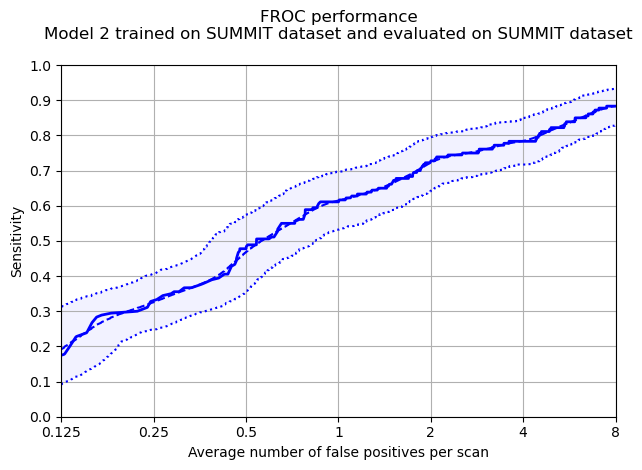

In [19]:

detection_predictions_path = combine_predictions(f'{workspace_path}/models/detection/result/trained_summit/summit/balanced_female_for_inference', 'test')
detection_predictions = pd.read_csv(detection_predictions_path)

annotations = (
    pd.read_csv(f'{workspace_path}/metadata/summit/balanced_female_for_inference/test_metadata.csv')
    .assign(name=lambda df: df.participant_id + '_Y0_BASELINE_A')
    .assign(row=lambda df: df['nodule_x_coordinate'])
    .assign(col=lambda df: df['nodule_y_coordinate'])
    .assign(index=lambda df: df['nodule_z_coordinate'])
    .assign(diameter=lambda df: df['nodule_diameter_mm'])
    .assign(diameter_cats=lambda df: pd.cut(
        df['nodule_diameter_mm'],
        bins=diameter_cats,
        labels=diameter_lbs
    ))
    .assign(nodule_site_combined=lambda df: df['nodule_site'].apply(combine_site))
    .assign(nodule_site_combined2=lambda df: df['nodule_site'].apply(combine_site2))
)

annotations.to_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv', index=False)

detection_summit_summit = noduleCADEvaluation(
    annotations_filename=f'{workspace_path}/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv',
    annotations_excluded_filename=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    seriesuids_filename=f'{workspace_path}/metadata/summit/balanced_female_for_inference/test_scans.csv',
    results_filename=detection_predictions_path,
    filter='\nModel 2 trained on SUMMIT dataset and evaluated on SUMMIT dataset\n',
    outputDir=f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference',
)
caluclate_cpm_from_bootstrapping(f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/froc_predictions_bootstrapping.csv')
show_metrics(f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/CADAnalysis.txt')


### Gender analysis

Protected Group: FEMALE


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,52.0,6.0,11.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpalfqogng/annotations.csv
Total number of included nodule annotations: 179
Total number of nodule annotations: 179
Cases: 170


100%|██████████| 1000/1000 [00:04<00:00, 234.59it/s]


,0,159,476,1111,2381,4920,9999
0,0.2 (0.1 - 0.33),0.34 (0.25 - 0.42),0.47 (0.37 - 0.58),0.62 (0.54 - 0.7),0.72 (0.65 - 0.8),0.79 (0.72 - 0.85),0.88 (0.83 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.20,0.10,0.33
159,0.25,0.34,0.25,0.42
476,0.50,0.47,0.37,0.58
1111,1.00,0.62,0.54,0.70
2381,2.00,0.72,0.65,0.80
4920,4.00,0.79,0.72,0.85
9999,8.00,0.88,0.83,0.93


Mean Sensitivity: 0.57 Low Sensitivity: 0.49 High Sensitivity: 0.66


,True positives,164
0,False positives,3223.000
1,False negatives,15.000
2,True negatives,0.000
3,Total number of candidates,3468.000
4,Total number of nodules,179.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,81.000
7,Sensitivity,0.916
8,Average number of candidates per scan,20.400


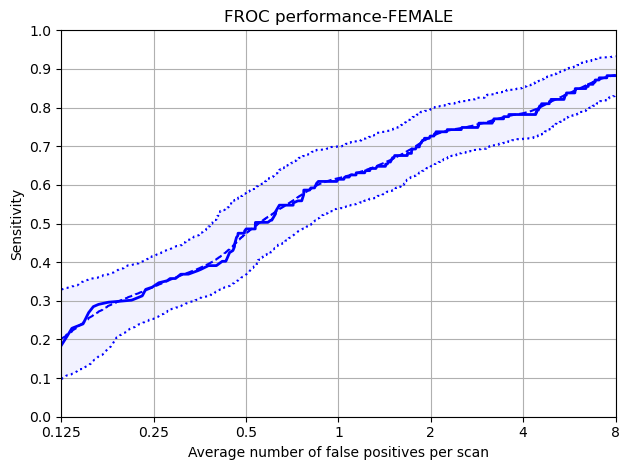

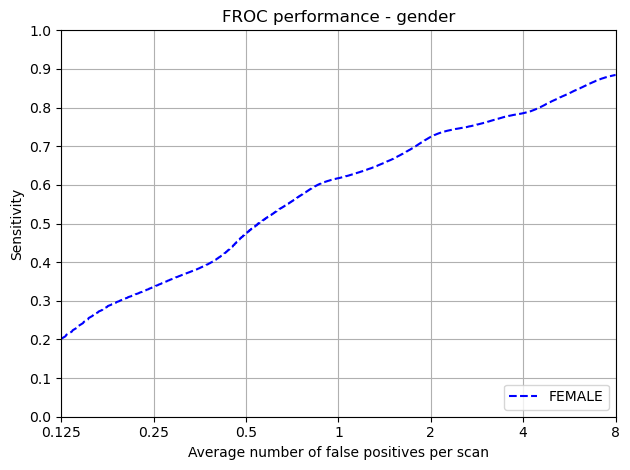

In [20]:


annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv')

predictions = pd.read_csv(detection_predictions_path)

protected_group = 'gender'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Ethnicity Analysis

Protected Group: Black


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,64.0,5.0,2.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpod9_05xg/annotations.csv
Total number of included nodule annotations: 44
Total number of nodule annotations: 44
Cases: 56


100%|██████████| 1000/1000 [00:01<00:00, 694.31it/s]


,0,159,476,1111,2381,4920,9999
0,0.48 (0.25 - 0.68),0.62 (0.43 - 0.82),0.76 (0.58 - 0.91),0.8 (0.65 - 0.93),0.89 (0.77 - 0.97),0.91 (0.84 - 1.0),0.95 (0.87 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.48,0.25,0.68
159,0.25,0.62,0.43,0.82
476,0.50,0.76,0.58,0.91
1111,1.00,0.80,0.65,0.93
2381,2.00,0.89,0.77,0.97
4920,4.00,0.91,0.84,1.00
9999,8.00,0.95,0.87,1.00


Mean Sensitivity: 0.77 Low Sensitivity: 0.63 High Sensitivity: 0.9


,True positives,42
0,False positives,817.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,871.000
4,Total number of nodules,44.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,12.000
7,Sensitivity,0.955
8,Average number of candidates per scan,15.554


Protected Group: White


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,26.0,47.0,6.0,12.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp3sm5p4a_/annotations.csv
Total number of included nodule annotations: 78
Total number of nodule annotations: 78
Cases: 58


100%|██████████| 1000/1000 [00:01<00:00, 501.12it/s]


,0,159,476,1111,2381,4920,9999
0,0.12 (0.02 - 0.29),0.26 (0.13 - 0.4),0.39 (0.26 - 0.54),0.56 (0.44 - 0.69),0.66 (0.54 - 0.8),0.73 (0.61 - 0.84),0.83 (0.72 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.12,0.02,0.29
159,0.25,0.26,0.13,0.40
476,0.50,0.39,0.26,0.54
1111,1.00,0.56,0.44,0.69
2381,2.00,0.66,0.54,0.80
4920,4.00,0.73,0.61,0.84
9999,8.00,0.83,0.72,0.93


Mean Sensitivity: 0.51 Low Sensitivity: 0.39 High Sensitivity: 0.64


,True positives,72
0,False positives,1329.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,1432.000
4,Total number of nodules,78.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,31.000
7,Sensitivity,0.923
8,Average number of candidates per scan,24.690


Protected Group: Asian or Asian British


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,49.0,5.0,16.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpvdak90v4/annotations.csv
Total number of included nodule annotations: 57
Total number of nodule annotations: 57
Cases: 58


100%|██████████| 1000/1000 [00:01<00:00, 556.85it/s]


,0,159,476,1111,2381,4920,9999
0,0.15 (0.03 - 0.29),0.22 (0.12 - 0.35),0.33 (0.18 - 0.52),0.52 (0.38 - 0.66),0.65 (0.53 - 0.76),0.78 (0.67 - 0.89),0.86 (0.76 - 0.96)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.15,0.03,0.29
159,0.25,0.22,0.12,0.35
476,0.50,0.33,0.18,0.52
1111,1.00,0.52,0.38,0.66
2381,2.00,0.65,0.53,0.76
4920,4.00,0.78,0.67,0.89
9999,8.00,0.86,0.76,0.96


Mean Sensitivity: 0.5 Low Sensitivity: 0.38 High Sensitivity: 0.63


,True positives,50
0,False positives,1077.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,1165.000
4,Total number of nodules,57.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,38.000
7,Sensitivity,0.877
8,Average number of candidates per scan,20.086


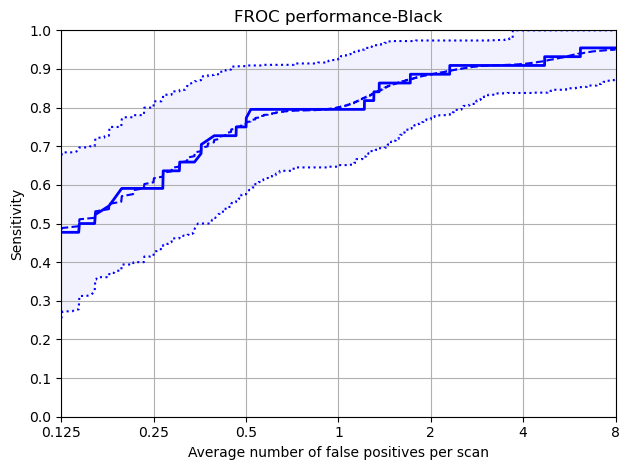

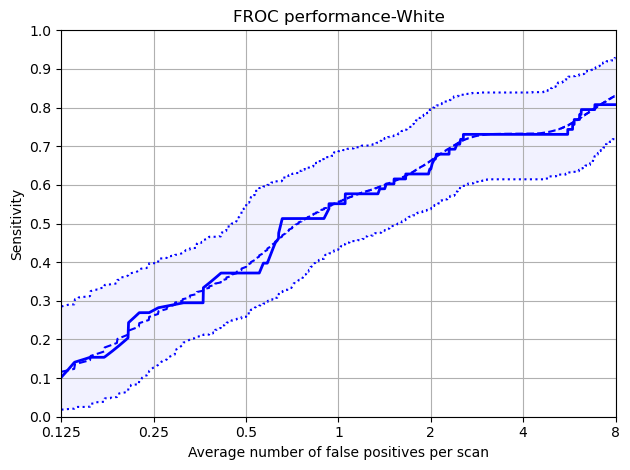

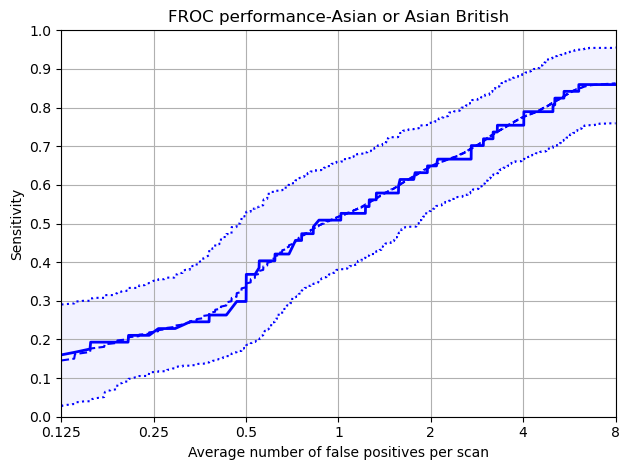

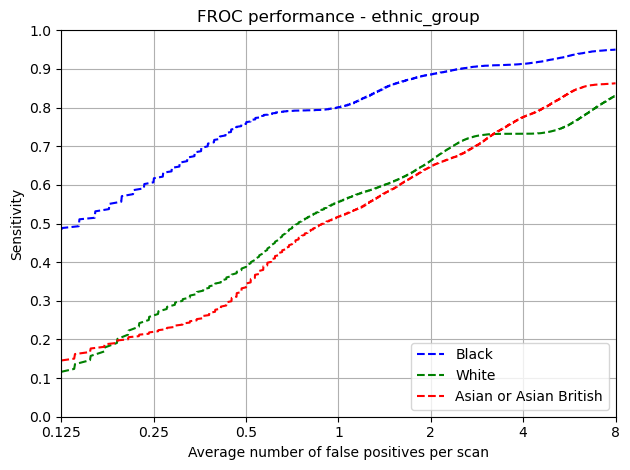

In [21]:
protected_group = 'ethnic_group'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### IMDRank_tertile

Protected Group: High


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,40.0,5.0,19.0,5.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp24k0mqqv/annotations.csv
Total number of included nodule annotations: 42
Total number of nodule annotations: 42
Cases: 44


100%|██████████| 1000/1000 [00:01<00:00, 716.60it/s]


,0,159,476,1111,2381,4920,9999
0,0.15 (0.0 - 0.4),0.35 (0.13 - 0.55),0.51 (0.32 - 0.69),0.61 (0.45 - 0.78),0.67 (0.52 - 0.82),0.7 (0.55 - 0.86),0.83 (0.68 - 0.95)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.15,0.00,0.40
159,0.25,0.35,0.13,0.55
476,0.50,0.51,0.32,0.69
1111,1.00,0.61,0.45,0.78
2381,2.00,0.67,0.52,0.82
4920,4.00,0.70,0.55,0.86
9999,8.00,0.83,0.68,0.95


Mean Sensitivity: 0.55 Low Sensitivity: 0.38 High Sensitivity: 0.72


,True positives,37
0,False positives,789.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,846.000
4,Total number of nodules,42.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.881
8,Average number of candidates per scan,19.227


Protected Group: Medium


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,43.0,8.0,13.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpp0pj1wa9/annotations.csv
Total number of included nodule annotations: 60
Total number of nodule annotations: 60
Cases: 54


100%|██████████| 1000/1000 [00:01<00:00, 577.93it/s]


,0,159,476,1111,2381,4920,9999
0,0.26 (0.11 - 0.42),0.29 (0.16 - 0.45),0.42 (0.22 - 0.62),0.6 (0.45 - 0.74),0.73 (0.59 - 0.86),0.79 (0.65 - 0.9),0.9 (0.81 - 0.98)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.26,0.11,0.42
159,0.25,0.29,0.16,0.45
476,0.50,0.42,0.22,0.62
1111,1.00,0.60,0.45,0.74
2381,2.00,0.73,0.59,0.86
4920,4.00,0.79,0.65,0.90
9999,8.00,0.90,0.81,0.98


Mean Sensitivity: 0.57 Low Sensitivity: 0.43 High Sensitivity: 0.71


,True positives,56
0,False positives,1090.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,1180.000
4,Total number of nodules,60.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,34.000
7,Sensitivity,0.933
8,Average number of candidates per scan,21.852


Protected Group: Low


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,21.0,64.0,4.0,4.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpm_11c31n/annotations.csv
Total number of included nodule annotations: 75
Total number of nodule annotations: 75
Cases: 68


100%|██████████| 1000/1000 [00:01<00:00, 519.79it/s]


,0,159,476,1111,2381,4920,9999
0,0.16 (0.03 - 0.34),0.32 (0.18 - 0.49),0.5 (0.34 - 0.66),0.62 (0.5 - 0.74),0.76 (0.62 - 0.87),0.83 (0.75 - 0.91),0.89 (0.8 - 0.96)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.16,0.03,0.34
159,0.25,0.32,0.18,0.49
476,0.50,0.50,0.34,0.66
1111,1.00,0.62,0.50,0.74
2381,2.00,0.76,0.62,0.87
4920,4.00,0.83,0.75,0.91
9999,8.00,0.89,0.80,0.96


Mean Sensitivity: 0.58 Low Sensitivity: 0.46 High Sensitivity: 0.71


,True positives,69
0,False positives,1292.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,1388.000
4,Total number of nodules,75.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,27.000
7,Sensitivity,0.920
8,Average number of candidates per scan,20.412


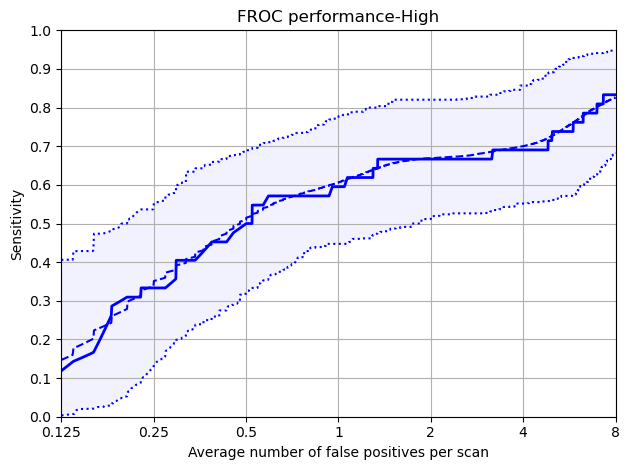

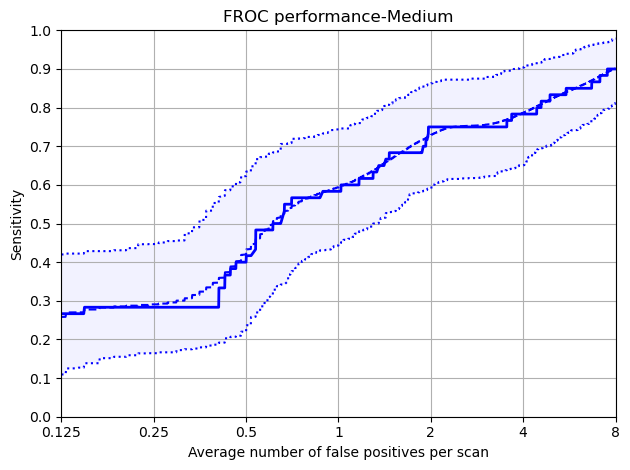

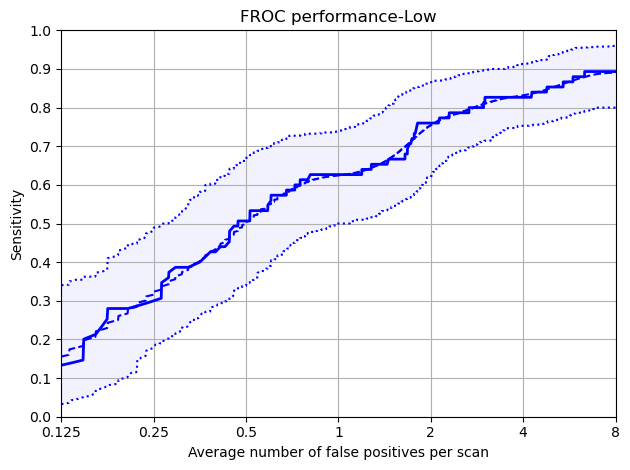

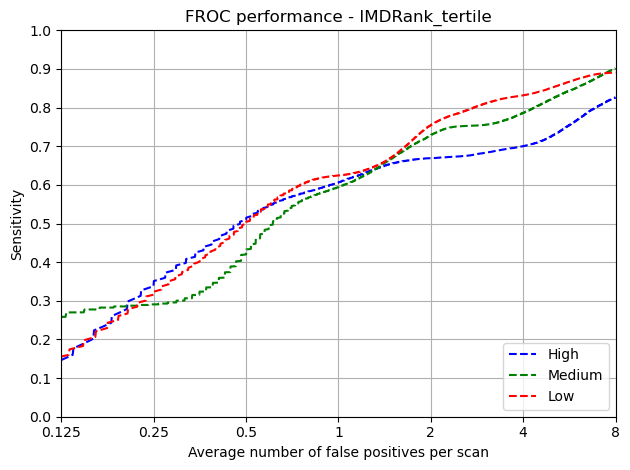

In [22]:
protected_group = 'IMDRank_tertile'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Smoking Pack Years


Protected Group: Medium (35-50)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,30.0,52.0,5.0,5.0,9.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpqlk2rn7w/annotations.csv
Total number of included nodule annotations: 64
Total number of nodule annotations: 64
Cases: 64


100%|██████████| 1000/1000 [00:01<00:00, 527.89it/s]


,0,159,476,1111,2381,4920,9999
0,0.16 (0.04 - 0.35),0.32 (0.15 - 0.47),0.46 (0.31 - 0.63),0.61 (0.45 - 0.78),0.72 (0.57 - 0.86),0.84 (0.71 - 0.94),0.9 (0.8 - 0.98)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.16,0.04,0.35
159,0.25,0.32,0.15,0.47
476,0.50,0.46,0.31,0.63
1111,1.00,0.61,0.45,0.78
2381,2.00,0.72,0.57,0.86
4920,4.00,0.84,0.71,0.94
9999,8.00,0.90,0.80,0.98


Mean Sensitivity: 0.57 Low Sensitivity: 0.43 High Sensitivity: 0.72


,True positives,58
0,False positives,1197.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,1287.000
4,Total number of nodules,64.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,32.000
7,Sensitivity,0.906
8,Average number of candidates per scan,20.109


Protected Group: Low (15-35)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,24.0,63.0,4.0,7.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp0l9fbgm3/annotations.csv
Total number of included nodule annotations: 76
Total number of nodule annotations: 76
Cases: 77


100%|██████████| 1000/1000 [00:02<00:00, 467.85it/s]


,0,159,476,1111,2381,4920,9999
0,0.27 (0.12 - 0.42),0.37 (0.25 - 0.51),0.59 (0.39 - 0.74),0.71 (0.6 - 0.81),0.78 (0.69 - 0.86),0.8 (0.72 - 0.88),0.9 (0.84 - 0.96)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.27,0.12,0.42
159,0.25,0.37,0.25,0.51
476,0.50,0.59,0.39,0.74
1111,1.00,0.71,0.60,0.81
2381,2.00,0.78,0.69,0.86
4920,4.00,0.80,0.72,0.88
9999,8.00,0.90,0.84,0.96


Mean Sensitivity: 0.63 Low Sensitivity: 0.52 High Sensitivity: 0.74


,True positives,71
0,False positives,1444.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,1543.000
4,Total number of nodules,76.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,28.000
7,Sensitivity,0.934
8,Average number of candidates per scan,20.039


Protected Group: High (50+)


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,15.0,31.0,10.0,28.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpzlhrn9qx/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 31


100%|██████████| 1000/1000 [00:01<00:00, 750.29it/s]


,0,159,476,1111,2381,4920,9999
0,0.18 (0.02 - 0.39),0.28 (0.12 - 0.43),0.33 (0.19 - 0.48),0.42 (0.29 - 0.55),0.55 (0.39 - 0.75),0.67 (0.5 - 0.85),0.81 (0.65 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.18,0.02,0.39
159,0.25,0.28,0.12,0.43
476,0.50,0.33,0.19,0.48
1111,1.00,0.42,0.29,0.55
2381,2.00,0.55,0.39,0.75
4920,4.00,0.67,0.50,0.85
9999,8.00,0.81,0.65,0.93


Mean Sensitivity: 0.46 Low Sensitivity: 0.31 High Sensitivity: 0.63


,True positives,35
0,False positives,582.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,638.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,21.000
7,Sensitivity,0.897
8,Average number of candidates per scan,20.581


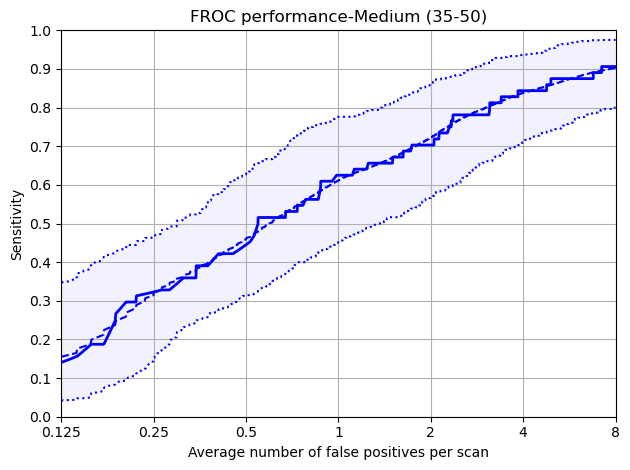

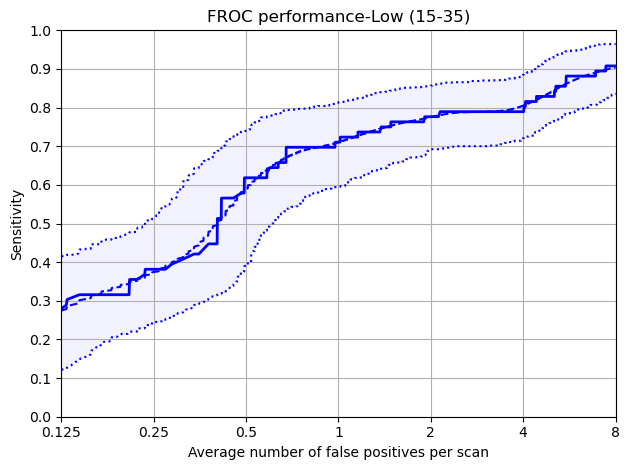

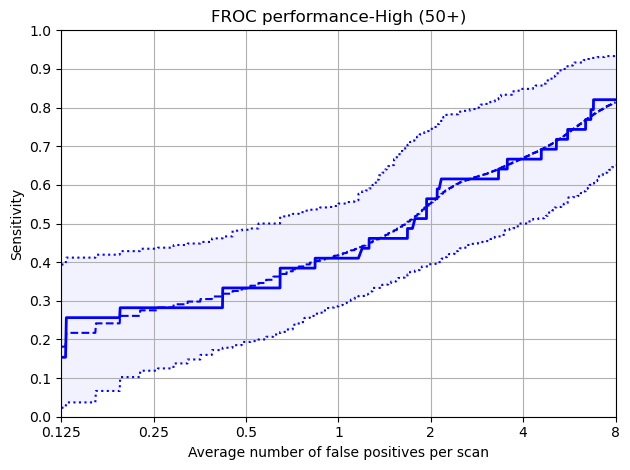

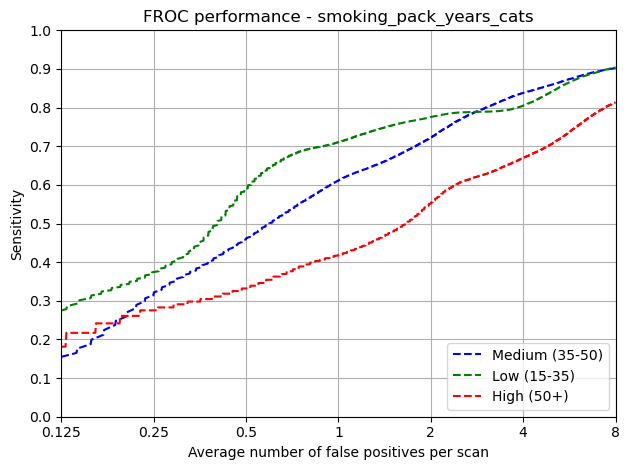

In [23]:
protected_group = 'smoking_pack_years_cats'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable Vs Non-Actionable

Protected Group: Non-Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpjifm1lsy/annotations.csv
Total number of included nodule annotations: 84
Total number of nodule annotations: 84
Cases: 125


100%|██████████| 1000/1000 [00:02<00:00, 351.58it/s]


,0,159,476,1111,2381,4920,9999
0,0.23 (0.09 - 0.42),0.41 (0.28 - 0.55),0.58 (0.41 - 0.73),0.72 (0.62 - 0.81),0.82 (0.73 - 0.9),0.88 (0.81 - 0.95),0.95 (0.91 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.23,0.09,0.42
159,0.25,0.41,0.28,0.55
476,0.50,0.58,0.41,0.73
1111,1.00,0.72,0.62,0.81
2381,2.00,0.82,0.73,0.90
4920,4.00,0.88,0.81,0.95
9999,8.00,0.95,0.91,1.00


Mean Sensitivity: 0.66 Low Sensitivity: 0.55 High Sensitivity: 0.77


,True positives,82
0,False positives,1921.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,2023.000
4,Total number of nodules,84.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.976
8,Average number of candidates per scan,16.184


Protected Group: Actonable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,26.0,11.0,18.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpnx9july6/annotations.csv
Total number of included nodule annotations: 95
Total number of nodule annotations: 95
Cases: 46


100%|██████████| 1000/1000 [00:02<00:00, 499.20it/s]


,0,159,476,1111,2381,4920,9999
0,0.21 (0.09 - 0.33),0.27 (0.17 - 0.39),0.38 (0.24 - 0.52),0.51 (0.36 - 0.65),0.62 (0.48 - 0.75),0.7 (0.58 - 0.81),0.77 (0.66 - 0.88)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.21,0.09,0.33
159,0.25,0.27,0.17,0.39
476,0.50,0.38,0.24,0.52
1111,1.00,0.51,0.36,0.65
2381,2.00,0.62,0.48,0.75
4920,4.00,0.70,0.58,0.81
9999,8.00,0.77,0.66,0.88


Mean Sensitivity: 0.49 Low Sensitivity: 0.37 High Sensitivity: 0.62


,True positives,82
0,False positives,1302.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,1445.000
4,Total number of nodules,95.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,61.000
7,Sensitivity,0.863
8,Average number of candidates per scan,31.413


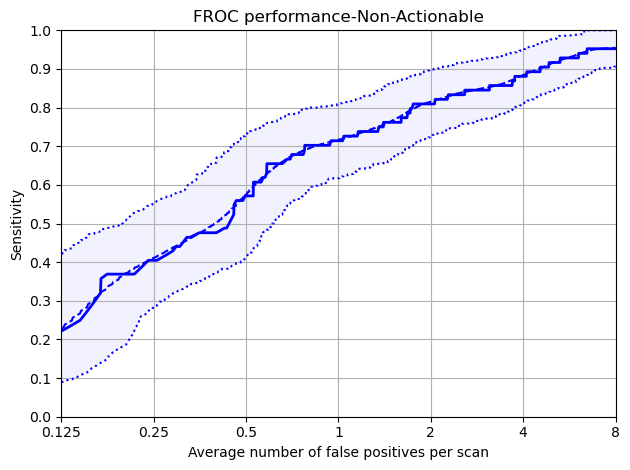

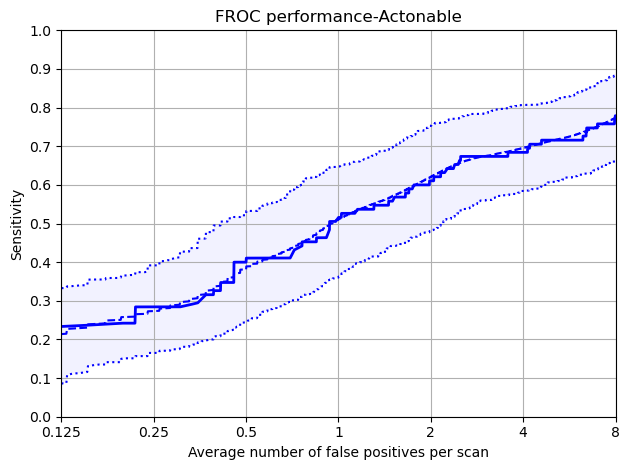

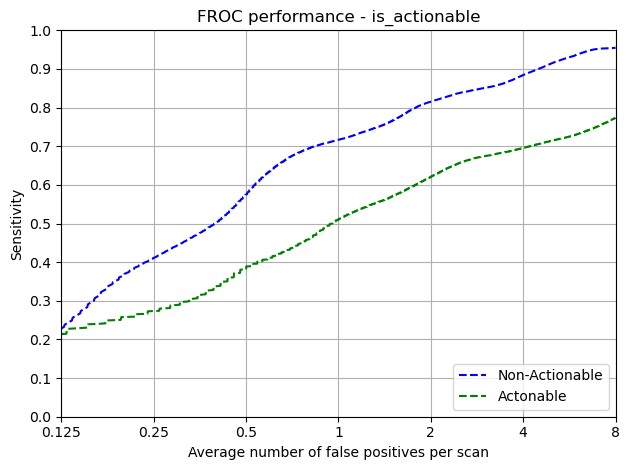

In [24]:
protected_group = 'is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable Gender

Protected Group: Female_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,26.0,11.0,18.0,15.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpujbsjced/annotations.csv
Total number of included nodule annotations: 95
Total number of nodule annotations: 95
Cases: 46


100%|██████████| 1000/1000 [00:02<00:00, 493.37it/s]


,0,159,476,1111,2381,4920,9999
0,0.21 (0.1 - 0.33),0.27 (0.17 - 0.38),0.38 (0.24 - 0.52),0.51 (0.37 - 0.65),0.62 (0.48 - 0.75),0.69 (0.59 - 0.8),0.77 (0.67 - 0.87)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.21,0.10,0.33
159,0.25,0.27,0.17,0.38
476,0.50,0.38,0.24,0.52
1111,1.00,0.51,0.37,0.65
2381,2.00,0.62,0.48,0.75
4920,4.00,0.69,0.59,0.80
9999,8.00,0.77,0.67,0.87


Mean Sensitivity: 0.49 Low Sensitivity: 0.37 High Sensitivity: 0.61


,True positives,82
0,False positives,1302.000
1,False negatives,13.000
2,True negatives,0.000
3,Total number of candidates,1445.000
4,Total number of nodules,95.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,61.000
7,Sensitivity,0.863
8,Average number of candidates per scan,31.413


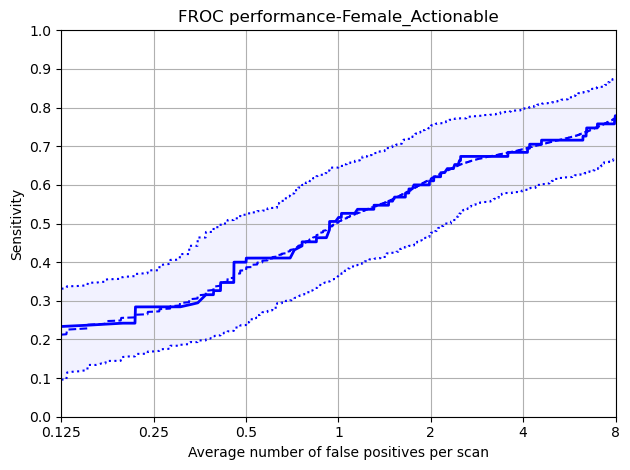

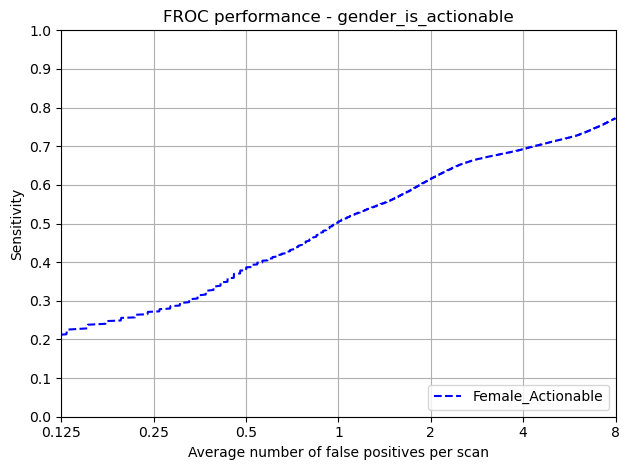

In [25]:
protected_group = 'gender_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)


### Non-Actionable Gender

Protected Group: Female_Non_Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,17.0,81.0,2.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpz167mhp_/annotations.csv
Total number of included nodule annotations: 84
Total number of nodule annotations: 84
Cases: 125


100%|██████████| 1000/1000 [00:02<00:00, 343.87it/s]


,0,159,476,1111,2381,4920,9999
0,0.22 (0.09 - 0.4),0.41 (0.28 - 0.55),0.57 (0.41 - 0.73),0.71 (0.62 - 0.81),0.81 (0.73 - 0.9),0.88 (0.8 - 0.95),0.95 (0.9 - 0.99)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.22,0.09,0.40
159,0.25,0.41,0.28,0.55
476,0.50,0.57,0.41,0.73
1111,1.00,0.71,0.62,0.81
2381,2.00,0.81,0.73,0.90
4920,4.00,0.88,0.80,0.95
9999,8.00,0.95,0.90,0.99


Mean Sensitivity: 0.65 Low Sensitivity: 0.55 High Sensitivity: 0.76


,True positives,82
0,False positives,1921.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,2023.000
4,Total number of nodules,84.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.976
8,Average number of candidates per scan,16.184


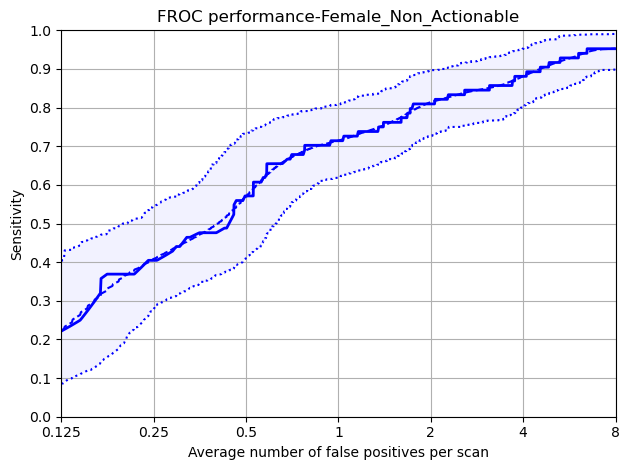

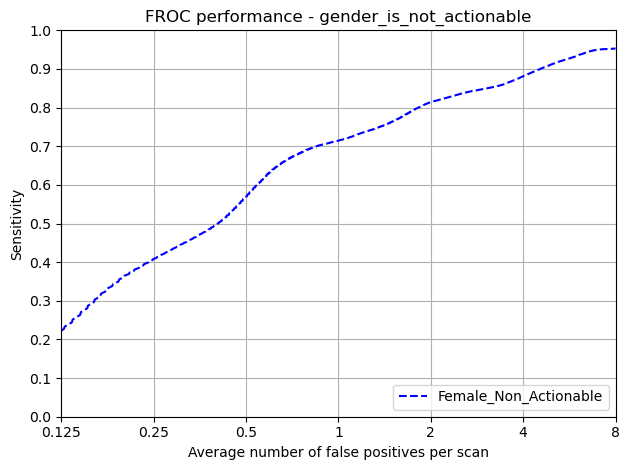

In [26]:
protected_group = 'gender_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable Ethnic Group

Protected Group: White_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,27.0,27.0,11.0,18.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpw_s8489z/annotations.csv
Total number of included nodule annotations: 44
Total number of nodule annotations: 44
Cases: 18


100%|██████████| 1000/1000 [00:01<00:00, 859.72it/s]


,0,159,476,1111,2381,4920,9999
0,0.27 (0.1 - 0.42),0.32 (0.16 - 0.5),0.42 (0.25 - 0.6),0.54 (0.36 - 0.72),0.63 (0.45 - 0.85),0.71 (0.54 - 0.87),0.76 (0.57 - 0.93)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.27,0.10,0.42
159,0.25,0.32,0.16,0.50
476,0.50,0.42,0.25,0.60
1111,1.00,0.54,0.36,0.72
2381,2.00,0.63,0.45,0.85
4920,4.00,0.71,0.54,0.87
9999,8.00,0.76,0.57,0.93


Mean Sensitivity: 0.52 Low Sensitivity: 0.35 High Sensitivity: 0.7


,True positives,40
0,False positives,586.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,652.000
4,Total number of nodules,44.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,26.000
7,Sensitivity,0.909
8,Average number of candidates per scan,36.222


Protected Group: Asian_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,31.0,22.0,9.0,25.0,12.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmptowcvhf7/annotations.csv
Total number of included nodule annotations: 32
Total number of nodule annotations: 32
Cases: 19


100%|██████████| 1000/1000 [00:01<00:00, 908.88it/s]


,0,159,476,1111,2381,4920,9999
0,0.1 (0.0 - 0.26),0.15 (0.0 - 0.29),0.19 (0.05 - 0.38),0.39 (0.19 - 0.59),0.55 (0.39 - 0.7),0.64 (0.48 - 0.79),0.74 (0.59 - 0.89)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.10,0.00,0.26
159,0.25,0.15,0.00,0.29
476,0.50,0.19,0.05,0.38
1111,1.00,0.39,0.19,0.59
2381,2.00,0.55,0.39,0.70
4920,4.00,0.64,0.48,0.79
9999,8.00,0.74,0.59,0.89


Mean Sensitivity: 0.39 Low Sensitivity: 0.24 High Sensitivity: 0.56


,True positives,25
0,False positives,491.000
1,False negatives,7.000
2,True negatives,0.000
3,Total number of candidates,544.000
4,Total number of nodules,32.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,28.000
7,Sensitivity,0.781
8,Average number of candidates per scan,28.632


Protected Group: Black_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,37.0,32.0,11.0,5.0,16.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpbry38z96/annotations.csv
Total number of included nodule annotations: 19
Total number of nodule annotations: 19
Cases: 11


100%|██████████| 1000/1000 [00:00<00:00, 1268.24it/s]


,0,159,476,1111,2381,4920,9999
0,0.37 (0.04 - 0.8),0.46 (0.07 - 0.83),0.6 (0.27 - 0.89),0.67 (0.31 - 1.0),0.75 (0.4 - 1.0),0.82 (0.59 - 1.0),0.86 (0.67 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.37,0.04,0.80
159,0.25,0.46,0.07,0.83
476,0.50,0.60,0.27,0.89
1111,1.00,0.67,0.31,1.00
2381,2.00,0.75,0.40,1.00
4920,4.00,0.82,0.59,1.00
9999,8.00,0.86,0.67,1.00


Mean Sensitivity: 0.65 Low Sensitivity: 0.34 High Sensitivity: 0.93


,True positives,17
0,False positives,225.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,249.000
4,Total number of nodules,19.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,7.000
7,Sensitivity,0.895
8,Average number of candidates per scan,22.636


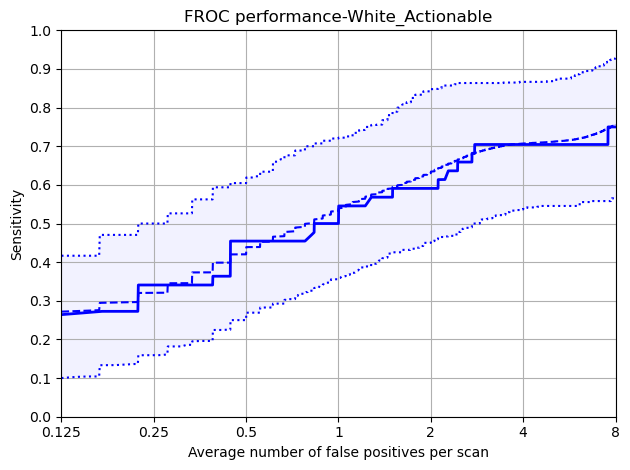

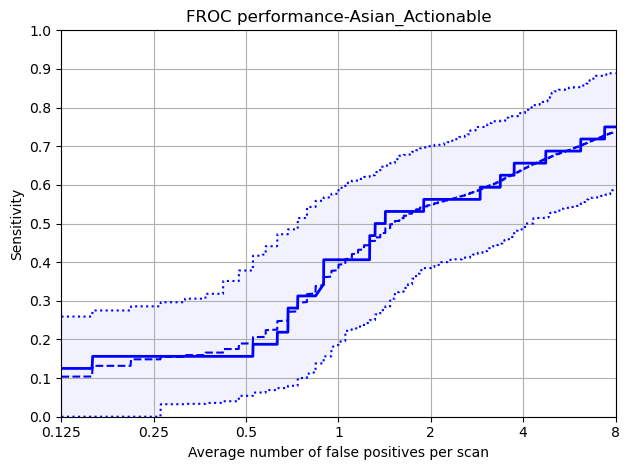

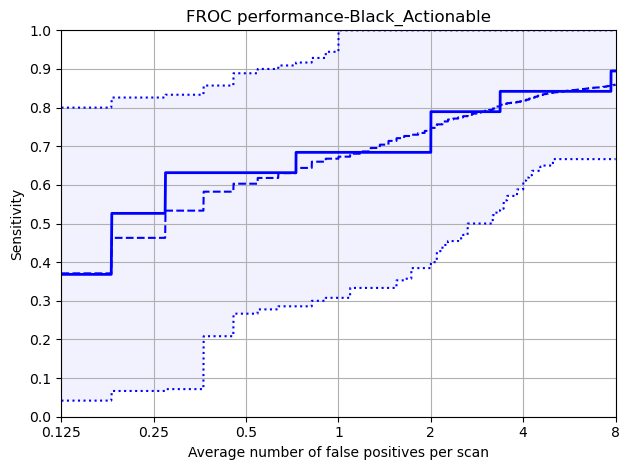

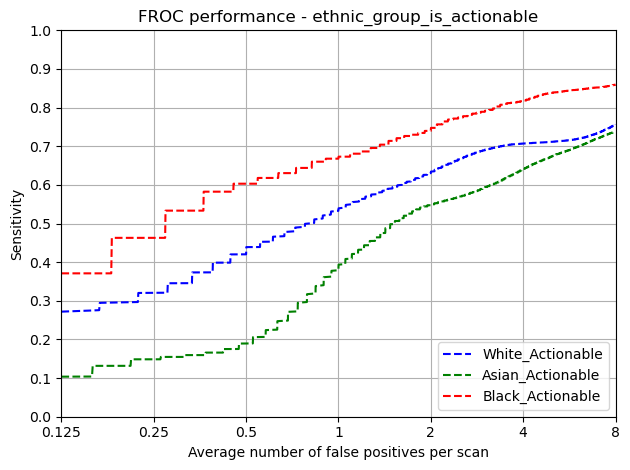

In [27]:
protected_group = 'ethnic_group_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)


### NonActionable - Ethnic Group

Protected Group: Black_Non_Actionable


,SOLID,PERIFISSURAL
nodule_type,12.0,88.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmppr9e8gu9/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 46


100%|██████████| 1000/1000 [00:01<00:00, 798.46it/s]


,0,159,476,1111,2381,4920,9999
0,0.54 (0.12 - 0.83),0.68 (0.45 - 0.94),0.86 (0.68 - 1.0),0.9 (0.76 - 1.0),0.96 (0.88 - 1.0),0.96 (0.89 - 1.0),1.0 (1.0 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.54,0.12,0.83
159,0.25,0.68,0.45,0.94
476,0.50,0.86,0.68,1.00
1111,1.00,0.90,0.76,1.00
2381,2.00,0.96,0.88,1.00
4920,4.00,0.96,0.89,1.00
9999,8.00,1.00,1.00,1.00


Mean Sensitivity: 0.84 Low Sensitivity: 0.68 High Sensitivity: 0.97


,True positives,25
0,False positives,592.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,622.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,5.000
7,Sensitivity,1.000
8,Average number of candidates per scan,13.522


Protected Group: White_Non_Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,24.0,74.0,3.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmppxnsq8zb/annotations.csv
Total number of included nodule annotations: 34
Total number of nodule annotations: 34
Cases: 41


100%|██████████| 1000/1000 [00:01<00:00, 713.35it/s]


,0,159,476,1111,2381,4920,9999
0,0.11 (0.0 - 0.28),0.23 (0.05 - 0.43),0.4 (0.23 - 0.64),0.6 (0.43 - 0.76),0.72 (0.58 - 0.88),0.77 (0.62 - 0.91),0.87 (0.75 - 0.97)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.11,0.00,0.28
159,0.25,0.23,0.05,0.43
476,0.50,0.40,0.23,0.64
1111,1.00,0.60,0.43,0.76
2381,2.00,0.72,0.58,0.88
4920,4.00,0.77,0.62,0.91
9999,8.00,0.87,0.75,0.97


Mean Sensitivity: 0.53 Low Sensitivity: 0.38 High Sensitivity: 0.7


,True positives,32
0,False positives,743.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,780.000
4,Total number of nodules,34.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,5.000
7,Sensitivity,0.941
8,Average number of candidates per scan,19.024


Protected Group: Asian_Non_Actionable


,SOLID,PERIFISSURAL,NON_SOLID
nodule_type,12.0,84.0,4.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpg4nr96ky/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 40


100%|██████████| 1000/1000 [00:01<00:00, 812.46it/s]


,0,159,476,1111,2381,4920,9999
0,0.21 (0.0 - 0.5),0.34 (0.11 - 0.64),0.52 (0.23 - 0.79),0.66 (0.47 - 0.85),0.77 (0.6 - 0.93),0.93 (0.81 - 1.0),1.0 (1.0 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.21,0.00,0.50
159,0.25,0.34,0.11,0.64
476,0.50,0.52,0.23,0.79
1111,1.00,0.66,0.47,0.85
2381,2.00,0.77,0.60,0.93
4920,4.00,0.93,0.81,1.00
9999,8.00,1.00,1.00,1.00


Mean Sensitivity: 0.63 Low Sensitivity: 0.46 High Sensitivity: 0.82


,True positives,25
0,False positives,586.000
1,False negatives,0.000
2,True negatives,0.000
3,Total number of candidates,621.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,10.000
7,Sensitivity,1.000
8,Average number of candidates per scan,15.525


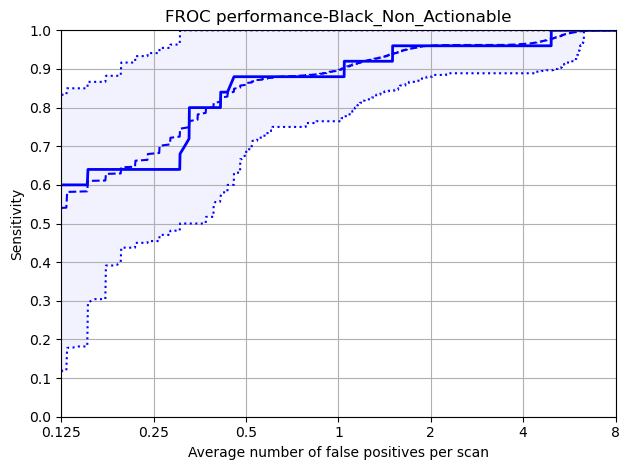

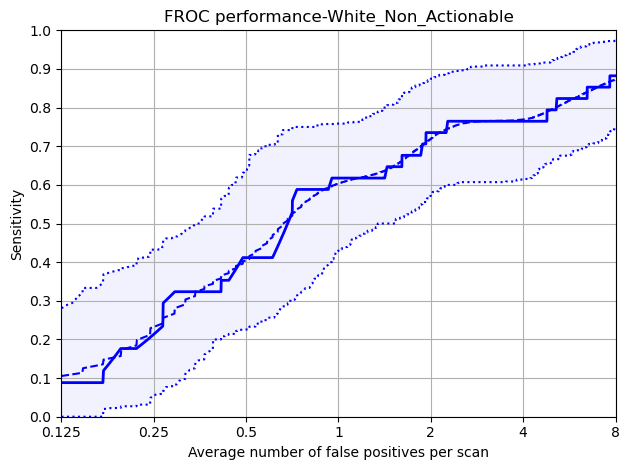

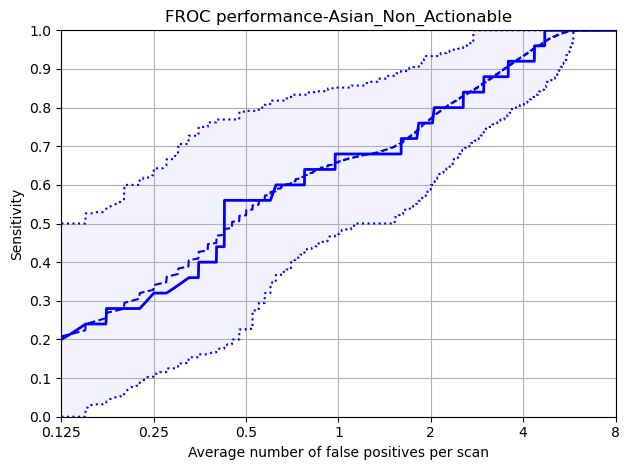

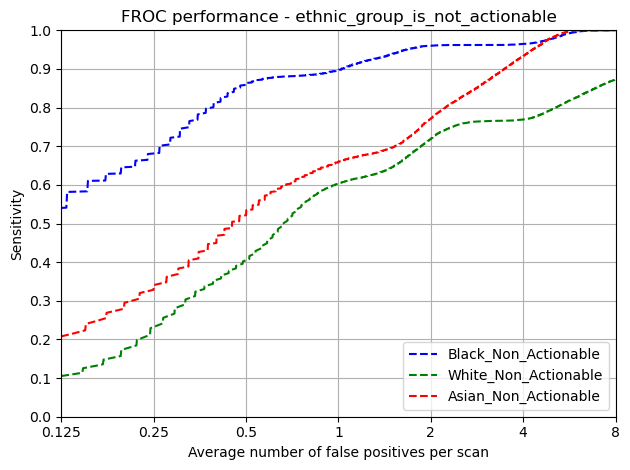

In [28]:
protected_group = 'ethnic_group_is_not_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable IMDRank

Protected Group: Medium_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,23.0,13.0,16.0,26.0,23.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp314hx6i5/annotations.csv
Total number of included nodule annotations: 31
Total number of nodule annotations: 31
Cases: 18


100%|██████████| 1000/1000 [00:01<00:00, 933.64it/s]


,0,159,476,1111,2381,4920,9999
0,0.1 (0.0 - 0.25),0.12 (0.0 - 0.29),0.22 (0.03 - 0.45),0.41 (0.23 - 0.62),0.58 (0.4 - 0.82),0.7 (0.53 - 0.89),0.86 (0.69 - 1.0)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.10,0.00,0.25
159,0.25,0.12,0.00,0.29
476,0.50,0.22,0.03,0.45
1111,1.00,0.41,0.23,0.62
2381,2.00,0.58,0.40,0.82
4920,4.00,0.70,0.53,0.89
9999,8.00,0.86,0.69,1.00


Mean Sensitivity: 0.43 Low Sensitivity: 0.27 High Sensitivity: 0.62


,True positives,29
0,False positives,490.000
1,False negatives,2.000
2,True negatives,0.000
3,Total number of candidates,547.000
4,Total number of nodules,31.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,28.000
7,Sensitivity,0.935
8,Average number of candidates per scan,30.389


Protected Group: Low_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,33.0,41.0,8.0,5.0,13.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp2rj440_a/annotations.csv
Total number of included nodule annotations: 39
Total number of nodule annotations: 39
Cases: 19


100%|██████████| 1000/1000 [00:01<00:00, 924.99it/s]


,0,159,476,1111,2381,4920,9999
0,0.27 (0.02 - 0.45),0.33 (0.15 - 0.49),0.48 (0.24 - 0.71),0.64 (0.42 - 0.83),0.73 (0.54 - 0.89),0.8 (0.66 - 0.93),0.82 (0.67 - 0.95)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.27,0.02,0.45
159,0.25,0.33,0.15,0.49
476,0.50,0.48,0.24,0.71
1111,1.00,0.64,0.42,0.83
2381,2.00,0.73,0.54,0.89
4920,4.00,0.80,0.66,0.93
9999,8.00,0.82,0.67,0.95


Mean Sensitivity: 0.58 Low Sensitivity: 0.39 High Sensitivity: 0.75


,True positives,33
0,False positives,495.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,548.000
4,Total number of nodules,39.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,20.000
7,Sensitivity,0.846
8,Average number of candidates per scan,28.842


Protected Group: High_IMDRank_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,36.0,20.0,8.0,28.0,8.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpmi73zg8v/annotations.csv
Total number of included nodule annotations: 25
Total number of nodule annotations: 25
Cases: 11


100%|██████████| 1000/1000 [00:00<00:00, 1148.76it/s]


,0,159,476,1111,2381,4920,9999
0,0.19 (0.0 - 0.53),0.3 (0.0 - 0.54),0.43 (0.23 - 0.59),0.48 (0.31 - 0.72),0.55 (0.33 - 0.74),0.56 (0.37 - 0.74),0.6 (0.38 - 0.85)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.19,0.00,0.53
159,0.25,0.30,0.00,0.54
476,0.50,0.43,0.23,0.59
1111,1.00,0.48,0.31,0.72
2381,2.00,0.55,0.33,0.74
4920,4.00,0.56,0.37,0.74
9999,8.00,0.60,0.38,0.85


Mean Sensitivity: 0.44 Low Sensitivity: 0.23 High Sensitivity: 0.67


,True positives,20
0,False positives,317.000
1,False negatives,5.000
2,True negatives,0.000
3,Total number of candidates,350.000
4,Total number of nodules,25.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,13.000
7,Sensitivity,0.800
8,Average number of candidates per scan,31.818


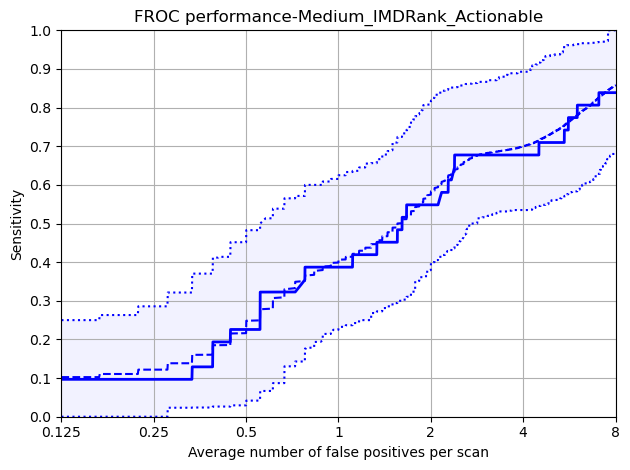

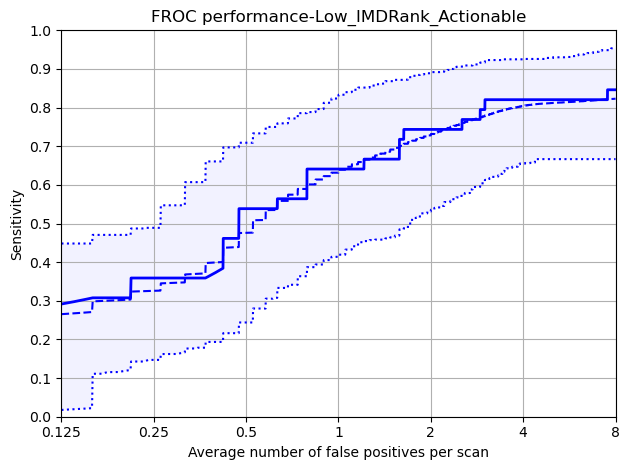

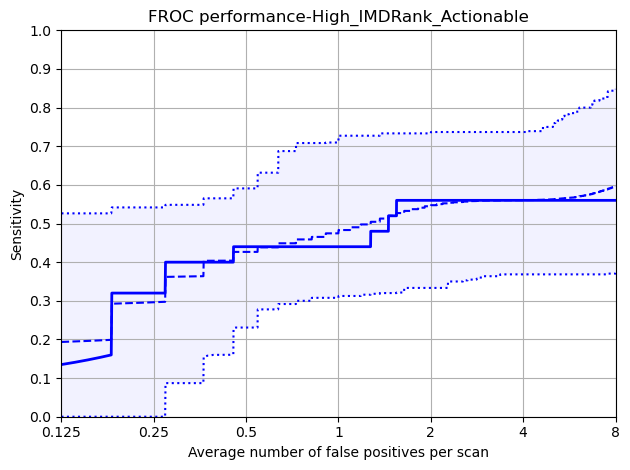

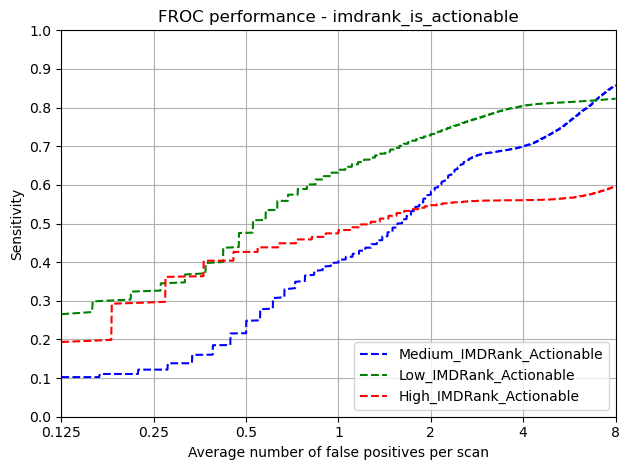

In [29]:
protected_group = 'imdrank_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)

### Actionable Smoking Status

Protected Group: Low_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,40.0,33.0,10.0,10.0,7.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpt0qox8n_/annotations.csv
Total number of included nodule annotations: 30
Total number of nodule annotations: 30
Cases: 15


100%|██████████| 1000/1000 [00:01<00:00, 950.80it/s]


,0,159,476,1111,2381,4920,9999
0,0.22 (0.06 - 0.42),0.3 (0.08 - 0.67),0.49 (0.12 - 0.79),0.69 (0.45 - 0.85),0.76 (0.61 - 0.86),0.76 (0.62 - 0.86),0.81 (0.69 - 0.94)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.22,0.06,0.42
159,0.25,0.30,0.08,0.67
476,0.50,0.49,0.12,0.79
1111,1.00,0.69,0.45,0.85
2381,2.00,0.76,0.61,0.86
4920,4.00,0.76,0.62,0.86
9999,8.00,0.81,0.69,0.94


Mean Sensitivity: 0.58 Low Sensitivity: 0.38 High Sensitivity: 0.77


,True positives,26
0,False positives,495.000
1,False negatives,4.000
2,True negatives,0.000
3,Total number of candidates,537.000
4,Total number of nodules,30.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,16.000
7,Sensitivity,0.867
8,Average number of candidates per scan,35.800


Protected Group: Medium_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,35.0,29.0,9.0,9.0,18.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmpdwkjr8uu/annotations.csv
Total number of included nodule annotations: 34
Total number of nodule annotations: 34
Cases: 20


100%|██████████| 1000/1000 [00:01<00:00, 986.89it/s]


,0,159,476,1111,2381,4920,9999
0,0.16 (0.0 - 0.41),0.29 (0.11 - 0.47),0.37 (0.22 - 0.55),0.48 (0.28 - 0.75),0.6 (0.37 - 0.86),0.72 (0.47 - 0.91),0.79 (0.6 - 0.95)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.16,0.00,0.41
159,0.25,0.29,0.11,0.47
476,0.50,0.37,0.22,0.55
1111,1.00,0.48,0.28,0.75
2381,2.00,0.60,0.37,0.86
4920,4.00,0.72,0.47,0.91
9999,8.00,0.79,0.60,0.95


Mean Sensitivity: 0.49 Low Sensitivity: 0.29 High Sensitivity: 0.7


,True positives,28
0,False positives,443.000
1,False negatives,6.000
2,True negatives,0.000
3,Total number of candidates,495.000
4,Total number of nodules,34.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,24.000
7,Sensitivity,0.824
8,Average number of candidates per scan,24.750


Protected Group: High_Pack_Years_Actionable


,SOLID,PERIFISSURAL,PART_SOLID,NON_SOLID,CALCIFIED
nodule_type,16.0,16.0,13.0,35.0,19.0


/var/folders/59/cd3dzx7560qgtrwc99hm0j2w0000gp/T/tmp6beuk0gl/annotations.csv
Total number of included nodule annotations: 31
Total number of nodule annotations: 31
Cases: 13


100%|██████████| 1000/1000 [00:00<00:00, 1047.97it/s]


,0,159,476,1111,2381,4920,9999
0,0.19 (0.0 - 0.35),0.22 (0.06 - 0.38),0.27 (0.11 - 0.47),0.41 (0.23 - 0.59),0.54 (0.33 - 0.78),0.62 (0.41 - 0.83),0.73 (0.53 - 0.91)


,fps,mean_sens,low_sens,high_sens
0,0.12,0.19,0.00,0.35
159,0.25,0.22,0.06,0.38
476,0.50,0.27,0.11,0.47
1111,1.00,0.41,0.23,0.59
2381,2.00,0.54,0.33,0.78
4920,4.00,0.62,0.41,0.83
9999,8.00,0.73,0.53,0.91


Mean Sensitivity: 0.43 Low Sensitivity: 0.24 High Sensitivity: 0.62


,True positives,28
0,False positives,364.000
1,False negatives,3.000
2,True negatives,0.000
3,Total number of candidates,413.000
4,Total number of nodules,31.000
5,Ignored candidates on excluded nodules,0.000
6,Ignored candidates which were double detec...,21.000
7,Sensitivity,0.903
8,Average number of candidates per scan,31.769


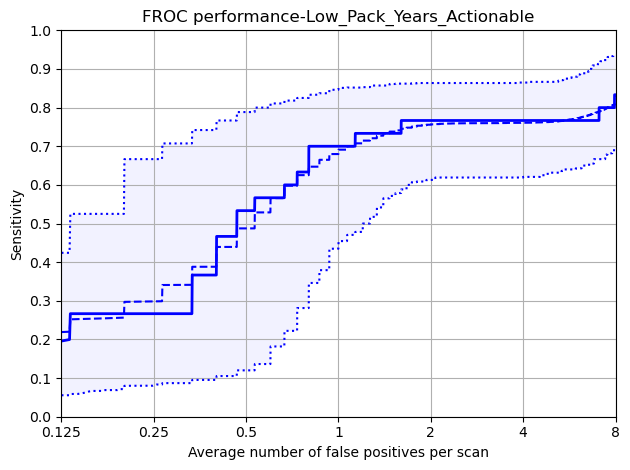

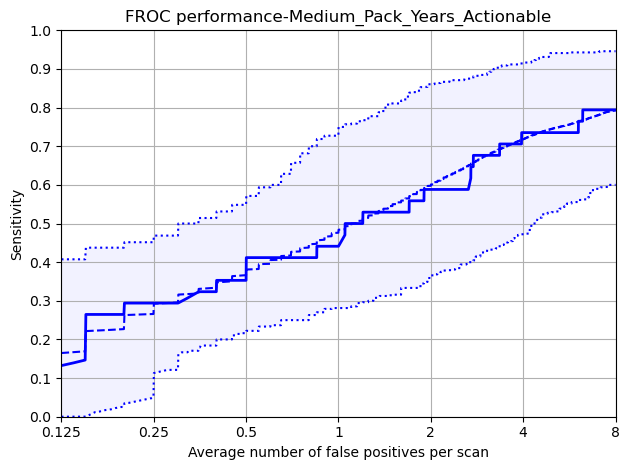

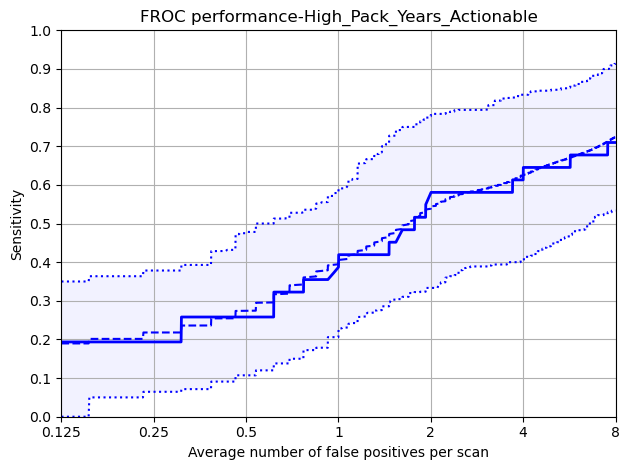

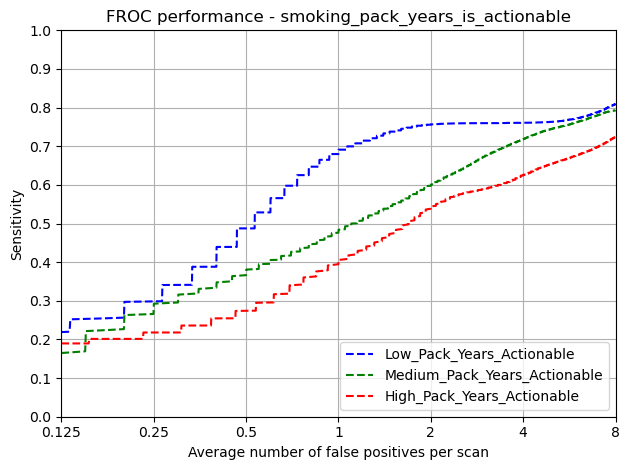

In [30]:
protected_group = 'smoking_pack_years_is_actionable'
data_dict = protected_group_analysis(
    protected_group, 
    scan_metadata, 
    annotations, 
    annotations_excluded, 
    predictions, 
    f'{workspace_path}/results/detection/trained_summit/summit/balanced_female_for_inference/{protected_group}'
)


### False Positive and Miss Analysis


In [31]:
thresholds = utils.get_thresholds(detection_summit_summit)
print(thresholds)
missed_metadata = utils.miss_anaysis_at_fpps(
    model='detection',
    scans_metadata=scan_metadata,
    scans_path=f'{workspace_path}/metadata/summit/balanced_female_for_inference/test_scans.csv',
    annotations_path=f'{workspace_path}/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv',
    exclusions_path=f'{workspace_path}/data/summit/metadata/annotations_excluded_empty.csv',
    predictions_path=detection_predictions_path,
    thresholds=thresholds
)

[0.99609375, 0.99169921875, 0.9814453125, 0.95751953125, 0.89501953125, 0.61865234375, 0.1795654296875]
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 0.99609375 FPPs: 151
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 0.99169921875 FPPs: 124
/Users/john/Projects/SOTAEvaluationNoduleDetection/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv
Total number of included nodule annotations: 180
Total number of nodule annotations: 180
Cases: 172
Missed Annotations at 0.9814453125 FPPs: 94
/Users/john/Projects/SOTAEvaluatio

In [32]:
hit_and_miss_dict = utils.get_protected_group_by_nodule_type(missed_metadata)

#### Incremental FROC Scores - Gender/ Ethnic Group / Nodule Type

In [33]:

# display(hit_and_miss_dict[0])
recode_dict = {}
for idx in range(7):
    hmm = {}
    for slice in ['all','actionable']:
        for protected_group in ['MALE','FEMALE','All', 'Asian or Asian British', 'Black', 'White']:
            for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:
            
                try:

                    group = 'gender' if protected_group in ['MALE','FEMALE','All'] else 'ethnic_group'

                    total = hit_and_miss_dict[idx][slice][group][(True,type)][protected_group] + hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    hits = hit_and_miss_dict[idx][slice][group][(False,type)][protected_group]
                    perc_hits = round(100 * (hits/total),0)

                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = perc_hits
                except:
                    print(f'Error: {idx}, {slice}, {protected_group}, {type}')
                    hmm[f'{slice}_{protected_group}_{type}_Hits%'] = 100
                    

    recode_dict[idx] = hmm

pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

df = pd.DataFrame.from_dict(recode_dict, orient='index').head(7)

# Remove ".0" from each value in the dataframe
df = df.applymap(lambda x: str(x).replace('.0', ''))

# Collapse each column into comma-delimited values
collapsed_df = df.apply(lambda x: ', '.join(x), axis=0)

display(collapsed_df)

from scipy.stats import shapiro, ttest_ind, mannwhitneyu

def calculate_significant_differences(df, group1_name, group2_name):

    group1 = df[group1_name].astype(int).values
    group2 = df[group2_name].astype(int).values

    shapiro_group1 = shapiro(group1)
    shapiro_group2 = shapiro(group2)

    print('*'*50)
    if shapiro_group1[1] > 0.05 and shapiro_group2[1] > 0.05:
        t_test = ttest_ind(group1, group2)
        print(f'Independent T-Test: {round(t_test.statistic,3)}, {round(t_test.pvalue,3)}')
    else:
        manwhitney = mannwhitneyu(group1, group2)
        print(f'Mann-Whitney U Test: {round(manwhitney.statistic,3)}, {round(manwhitney.pvalue,3)}')

a='White'
b='Black'

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** all {type} ***')
    group1 = f'all_{a}_{type}_Hits%'
    group2 = f'all_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

for type in ['SOLID','NON_SOLID','PART_SOLID','PERIFISSURAL','CALCIFIED']:

    print(f'*** actionable {type} ***')
    group1 = f'actionable_{a}_{type}_Hits%'
    group2 = f'actionable_{b}_{type}_Hits%'
    calculate_significant_differences(df, group1, group2)

Error: 0, all, MALE, SOLID
Error: 0, all, MALE, NON_SOLID
Error: 0, all, MALE, PART_SOLID
Error: 0, all, MALE, PERIFISSURAL
Error: 0, all, MALE, CALCIFIED
Error: 0, all, FEMALE, NON_SOLID
Error: 0, all, FEMALE, PART_SOLID
Error: 0, all, FEMALE, CALCIFIED
Error: 0, all, All, NON_SOLID
Error: 0, all, All, PART_SOLID
Error: 0, all, All, CALCIFIED
Error: 0, all, Asian or Asian British, NON_SOLID
Error: 0, all, Asian or Asian British, PART_SOLID
Error: 0, all, Asian or Asian British, CALCIFIED
Error: 0, all, Black, NON_SOLID
Error: 0, all, Black, PART_SOLID
Error: 0, all, Black, CALCIFIED
Error: 0, all, White, NON_SOLID
Error: 0, all, White, PART_SOLID
Error: 0, all, White, CALCIFIED
Error: 0, actionable, MALE, SOLID
Error: 0, actionable, MALE, NON_SOLID
Error: 0, actionable, MALE, PART_SOLID
Error: 0, actionable, MALE, PERIFISSURAL
Error: 0, actionable, MALE, CALCIFIED
Error: 0, actionable, FEMALE, NON_SOLID
Error: 0, actionable, FEMALE, PART_SOLID
Error: 0, actionable, FEMALE, CALCIFIED
E

all_MALE_SOLID_Hits%                                    100, 100, 100, 100, 100, 100, 100
all_MALE_NON_SOLID_Hits%                                100, 100, 100, 100, 100, 100, 100
all_MALE_PART_SOLID_Hits%                               100, 100, 100, 100, 100, 100, 100
all_MALE_PERIFISSURAL_Hits%                             100, 100, 100, 100, 100, 100, 100
all_MALE_CALCIFIED_Hits%                                100, 100, 100, 100, 100, 100, 100
all_FEMALE_SOLID_Hits%                                         23, 41, 64, 73, 80, 84, 89
all_FEMALE_NON_SOLID_Hits%                                     100, 5, 11, 26, 42, 47, 68
all_FEMALE_PART_SOLID_Hits%                                  100, 100, 30, 40, 60, 70, 80
all_FEMALE_PERIFISSURAL_Hits%                                  20, 39, 54, 70, 82, 87, 95
all_FEMALE_CALCIFIED_Hits%                                     100, 7, 21, 29, 36, 50, 79
all_All_SOLID_Hits%                                            23, 41, 64, 73, 80, 84, 89
all_All_NO

*** all SOLID ***
**************************************************
Mann-Whitney U Test: 12.0, 0.121
*** all NON_SOLID ***
**************************************************
Mann-Whitney U Test: 27.5, 0.741
*** all PART_SOLID ***
**************************************************
Mann-Whitney U Test: 27.0, 0.791
*** all PERIFISSURAL ***
**************************************************
Independent T-Test: -0.807, 0.436
*** all CALCIFIED ***
**************************************************
Independent T-Test: 0.333, 0.745
*** actionable SOLID ***
**************************************************
Mann-Whitney U Test: 9.0, 0.052
*** actionable NON_SOLID ***
**************************************************
Mann-Whitney U Test: 27.5, 0.741
*** actionable PART_SOLID ***
**************************************************
Mann-Whitney U Test: 27.0, 0.791
*** actionable PERIFISSURAL ***
**************************************************
Independent T-Test: 0.791, 0.444
*** actionable CAL

#### Nodule Characteristic Analysis

,RIGHT,LEFT,NOT_ANSWERED
0.125,0.17,0.09,0.22
0.25,0.30,0.27,0.38
0.5,0.49,0.48,0.45
1,0.61,0.59,0.62
2,0.70,0.73,0.78
4,0.76,0.80,0.82
8,0.88,0.93,0.85
Total Annotations,96.00,44.00,40.00


,UPPER,NOT-UPPER,NOT_ANSWERED
0.125,0.10,0.18,0.22
0.25,0.24,0.35,0.38
0.5,0.41,0.56,0.45
1,0.57,0.64,0.62
2,0.66,0.75,0.78
4,0.74,0.81,0.82
8,0.91,0.88,0.85
Total Annotations,68.00,72.00,40.00


,SOLID,NON_SOLID,PART_SOLID,PERIFISSURAL,CALCIFIED
0.125,0.23,0.00,0.0,0.20,0.00
0.25,0.41,0.05,0.0,0.39,0.07
0.5,0.64,0.11,0.3,0.54,0.21
1,0.73,0.26,0.4,0.70,0.29
2,0.80,0.42,0.6,0.82,0.36
4,0.84,0.47,0.7,0.87,0.50
8,0.89,0.68,0.8,0.95,0.79
Total Annotations,44.00,19.00,10.0,93.00,14.00


,RANDOMISATION_AT_YEAR_1,ALWAYS_SCAN_AT_YEAR_1,3_MONTH_FOLLOW_UP_SCAN,URGENT_REFERRAL
0.125,0.21,0.00,0.06,0.22
0.25,0.39,0.06,0.15,0.33
0.5,0.56,0.12,0.38,0.44
1,0.69,0.29,0.47,0.67
2,0.80,0.47,0.59,0.67
4,0.85,0.53,0.68,0.78
8,0.93,0.71,0.82,0.78
Total Annotations,120.00,17.00,34.00,9.00


,00-04,04-08,08-15,15-20,20-30,30-40
0.125,0.06,0.20,0.16,0.00,0.0,0.0
0.25,0.11,0.38,0.27,0.00,0.2,0.5
0.5,0.22,0.58,0.35,0.12,0.4,1.0
1,0.33,0.71,0.57,0.12,0.4,1.0
2,0.39,0.83,0.65,0.50,0.4,1.0
4,0.50,0.87,0.68,0.62,0.8,1.0
8,0.78,0.94,0.78,0.75,1.0,1.0
Total Annotations,18.00,110.00,37.00,8.00,5.0,2.0


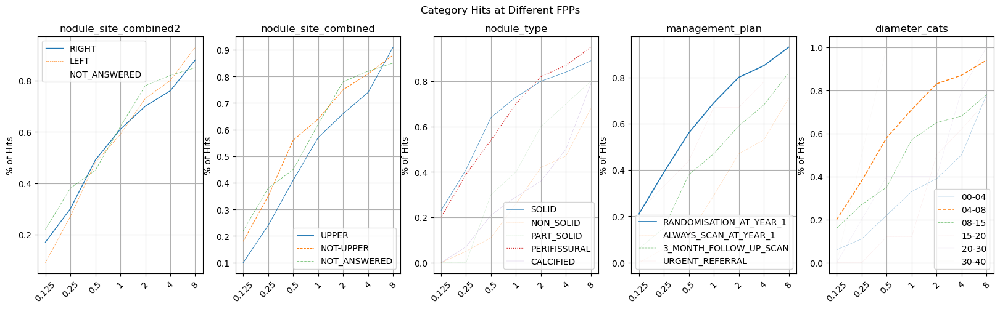

In [34]:

fig, ax = plt.subplots(1, 5, figsize=(20, 5))

nodule_characteristics = {
    'nodule_site_combined2': ['RIGHT', 'LEFT', 'NOT_ANSWERED'],
    'nodule_site_combined': ['UPPER','NOT-UPPER', 'NOT_ANSWERED'],
    'nodule_type': ['SOLID', 'NON_SOLID', 'PART_SOLID', 'PERIFISSURAL', 'CALCIFIED'],
    'management_plan': ['RANDOMISATION_AT_YEAR_1','ALWAYS_SCAN_AT_YEAR_1', '3_MONTH_FOLLOW_UP_SCAN', 'URGENT_REFERRAL'],
    'diameter_cats': diameter_lbs,
}

for ivx, (var, order) in enumerate(nodule_characteristics.items()):
    annotations = pd.read_csv(f'{workspace_path}/models/grt123/bbox_result/trained_summit/summit/balanced_female_for_inference/balanced_female_for_inference_metadata.csv')
    # annotations = annotations[annotations['management_plan'] != 'RANDOMISATION_AT_YEAR_1']

    total_vc = annotations[var].value_counts().sort_index().rename('Total Annotations')

    operating_points = ['0.125', '0.25', '0.5', '1', '2', '4', '8']

    results = []

    for idx, metadata in enumerate(missed_metadata):
        results.append(
            pd.crosstab(
                metadata[var], 
                metadata['miss'],
                normalize='index'
            )[False]
            .rename(f'{operating_points[idx]}')
            .reindex(order)
            
        )

    df = pd.concat(results, axis=1).fillna(0).round(2).merge(total_vc.to_frame(), left_index=True, right_index=True)

    display(df.T)


    line_styles = ['-', '--', '-.', ':', '-', '--', '-.']
    weights = df.pop('Total Annotations')

    for isx, column in enumerate(df.T):    
            ax[ivx].plot(df.T[column], label=column, linestyle=line_styles[isx], linewidth=weights[isx]/100)
    
    ax[ivx].set_xticklabels(labels=df.columns, rotation=45)
    ax[ivx].set_title(var)
    ax[ivx].legend()
    ax[ivx].set_ylabel('% of Hits')
    ax[ivx].grid(visible=True, which='both')

plt.suptitle('Category Hits at Different FPPs')
plt.show()

,FEMALE,Total
"(CALCIFIED, 3_MONTH_FOLLOW_UP_SCAN)",14 (7.8%),14 (7.8%)
"(NON_SOLID, ALWAYS_SCAN_AT_YEAR_1)",17 (9.4%),17 (9.4%)
"(NON_SOLID, RANDOMISATION_AT_YEAR_1)",2 (1.1%),2 (1.1%)
"(PART_SOLID, 3_MONTH_FOLLOW_UP_SCAN)",10 (5.6%),10 (5.6%)
"(PERIFISSURAL, RANDOMISATION_AT_YEAR_1)",93 (51.7%),93 (51.7%)
"(SOLID, 3_MONTH_FOLLOW_UP_SCAN)",10 (5.6%),10 (5.6%)
"(SOLID, RANDOMISATION_AT_YEAR_1)",25 (13.9%),25 (13.9%)
"(SOLID, URGENT_REFERRAL)",9 (5.0%),9 (5.0%)
Total,180,180


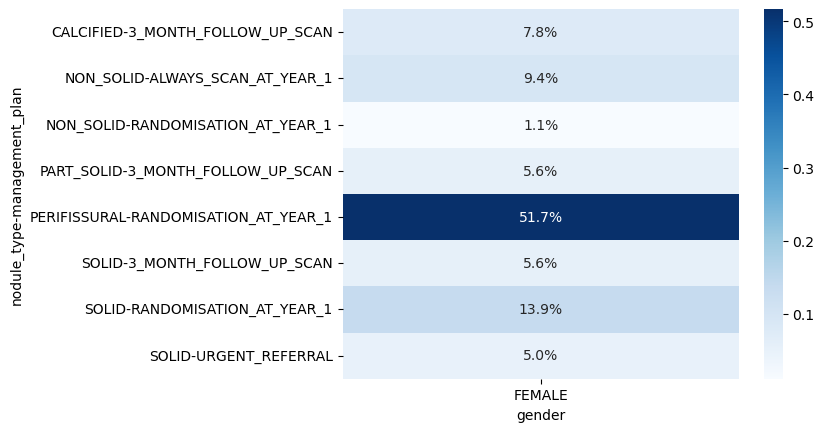

In [35]:
# Check what nodules have been missed by gender


missed_metadata_at_2fpps = missed_metadata[4]

def crosstab_with_percentages(rows, columns, x_order=None, y_order=None, table=False, heatmap=False):
    # Create the crosstab with absolutes
    cols = [c.astype(str) for c in columns]
    rows = [r.astype(str) for r in rows]

    xabs = pd.crosstab(rows, cols).fillna(0)
    xperc = pd.crosstab(rows, cols, normalize='columns').fillna(0)

    if x_order:
        xabs = xabs.reindex(x_order, axis=1)
        xperc = xperc.reindex(x_order, axis=1)

    if y_order:
        xabs = xabs.reindex(y_order)
        xperc = xperc.reindex(y_order)

    combined_data = {}

    for (adx, rabs), (pdx, rperc) in zip(xabs.iterrows(), xperc.iterrows()):

        row_data = {}
        row_total = 0

        for col in xabs.columns:
            row_data[col] = f"{rabs[col]} ({rperc[col]:.1%})"
            row_total += rabs[col]

        row_data['Total'] = f'{row_total} ({row_total / xabs.sum().sum():.1%})'
        combined_data[adx] = row_data

    row_data = {}
    row_total = 0
    for col in xabs.columns:
        row_data[col] = f'{sum(xabs[col])}'
        row_total += xabs[col].sum()

    row_data['Total'] = row_total
    combined_data['Total'] = row_data

    if table:
        display(pd.DataFrame.from_dict(combined_data).T)
        
    
    if heatmap:
        sns.heatmap(xperc, annot=True, fmt=".1%", cmap='Blues')
        plt.show()

    return xperc, pd.DataFrame.from_dict(combined_data)

_ = crosstab_with_percentages(
    [missed_metadata_at_2fpps['nodule_type'], missed_metadata_at_2fpps['management_plan']],
    [missed_metadata_at_2fpps['gender']],
    table=True,
    heatmap=True)

In [36]:
scans = pd.read_csv(f'{workspace_path}/metadata/summit/balanced_female_for_inference/test_scans.csv')
predictions = pd.read_csv(detection_predictions_path)
annotations = pd.read_csv(f'{workspace_path}/models/detection/result/trained_summit/summit/balanced_female_for_inference/annotations.csv')

false_positives_fpps = false_positive_analysis(
    thresholds=thresholds,    
    predictions=predictions,
    annotations=annotations
)

predictions: 48 at threshold: 0.99609375
distance false positives: 19 at threshold: 0.99609375
predictions: 97 at threshold: 0.99169921875
distance false positives: 41 at threshold: 0.99169921875
predictions: 171 at threshold: 0.9814453125
distance false positives: 85 at threshold: 0.9814453125
predictions: 280 at threshold: 0.95751953125
distance false positives: 170 at threshold: 0.95751953125
predictions: 472 at threshold: 0.89501953125
distance false positives: 342 at threshold: 0.89501953125
predictions: 831 at threshold: 0.61865234375
distance false positives: 686 at threshold: 0.61865234375
predictions: 1553 at threshold: 0.1795654296875
distance false positives: 1373 at threshold: 0.1795654296875


#### Examples of False Positives

None
summit-4247-hkj_Y0_BASELINE_A - 235 363 192 5.80078125
False Positive: True
IoU False Positive: nan


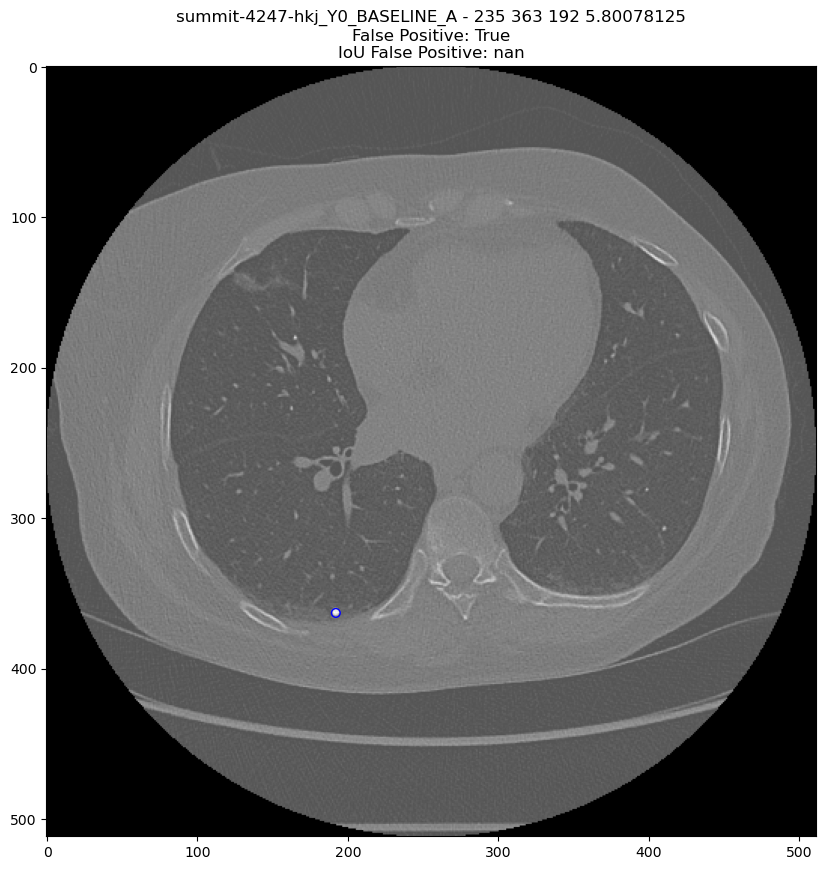

None
summit-5968-bsv_Y0_BASELINE_A - 288 214 160 5.9765625
False Positive: True
IoU False Positive: 0.0


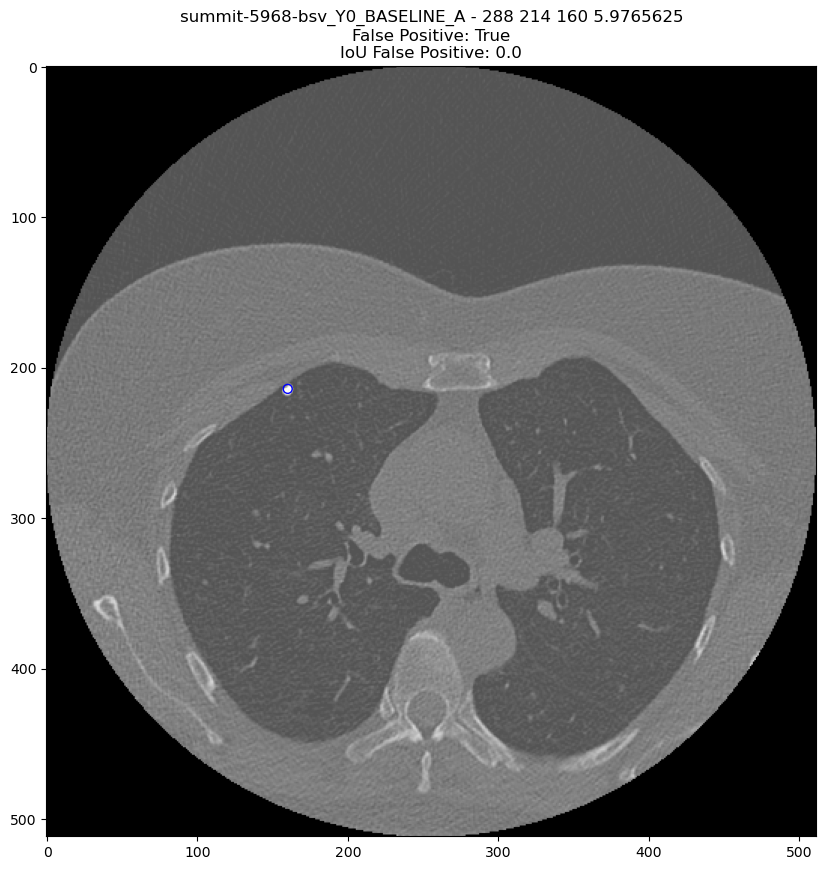

None
summit-9938-mxd_Y0_BASELINE_A - 423 162 342 6.15234375
False Positive: True
IoU False Positive: nan


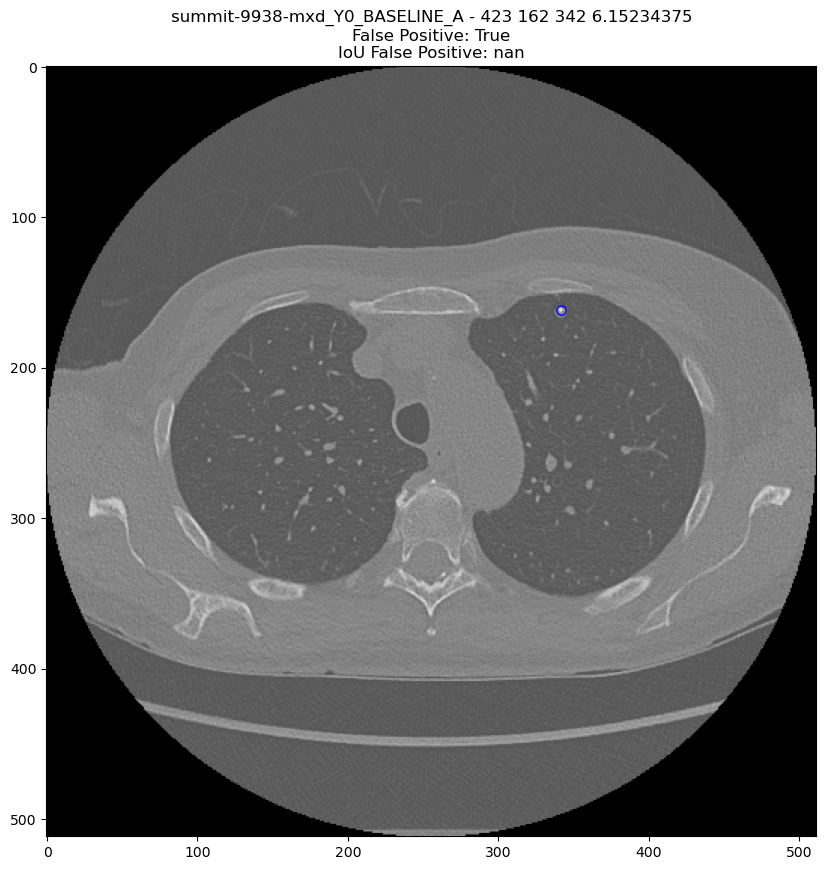

None
summit-5574-nhk_Y0_BASELINE_A - 185 213 63 5.09765625
False Positive: True
IoU False Positive: 0.0


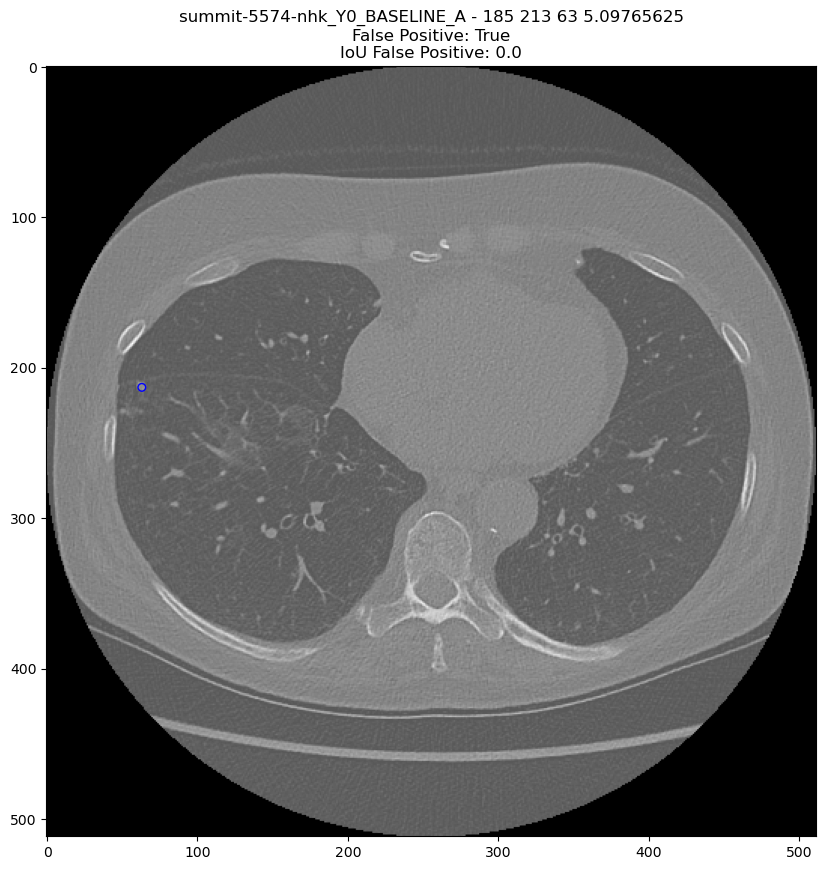

summit-8769-uas_Y0_BASELINE_A already exists
summit-8769-uas_Y0_BASELINE_A - 350 388 362 6.943359375
False Positive: True
IoU False Positive: nan


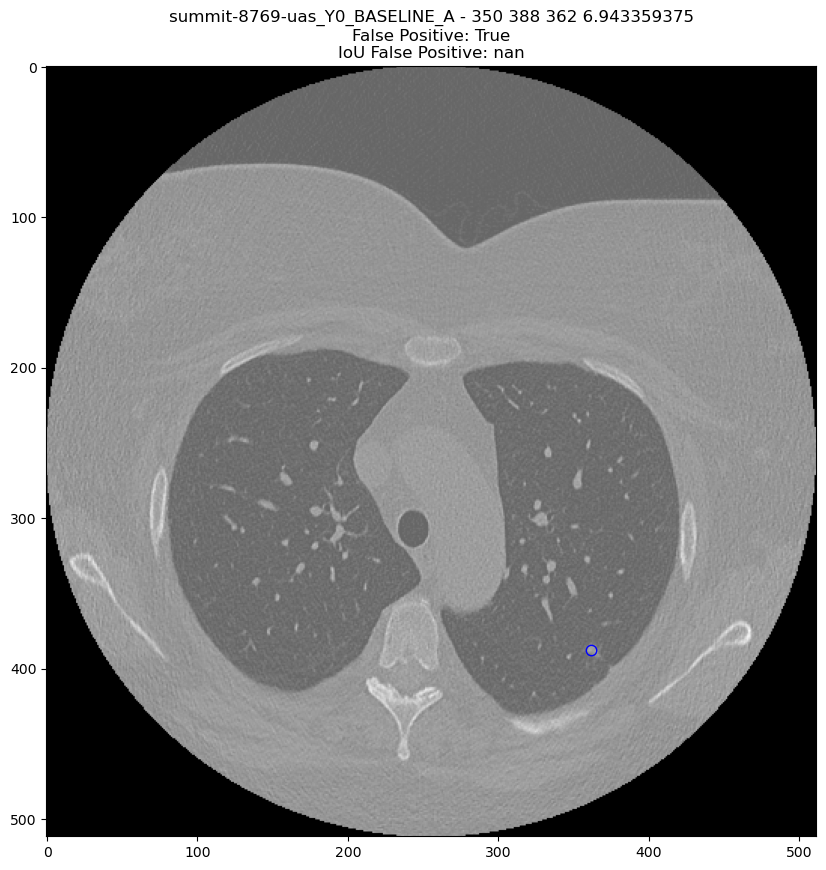

None
summit-6232-asp_Y0_BASELINE_A - 374 291 411 5.46875
False Positive: True
IoU False Positive: 0.0


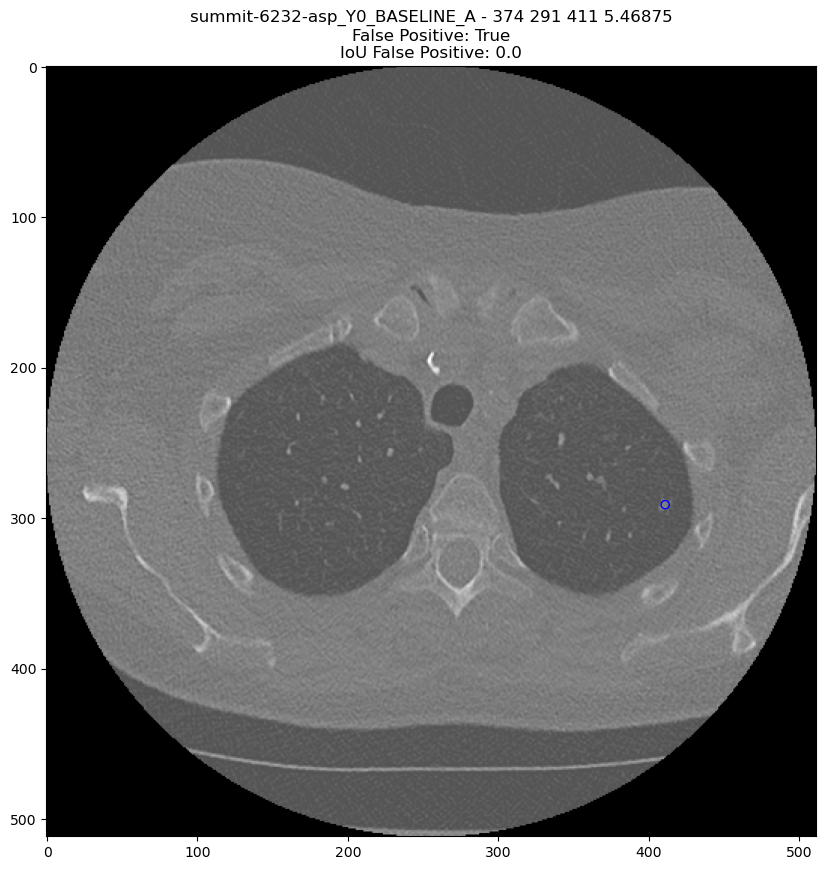

None
summit-7472-cwh_Y0_BASELINE_A - 249 362 196 17.5
False Positive: True
IoU False Positive: 0.012539695120993562


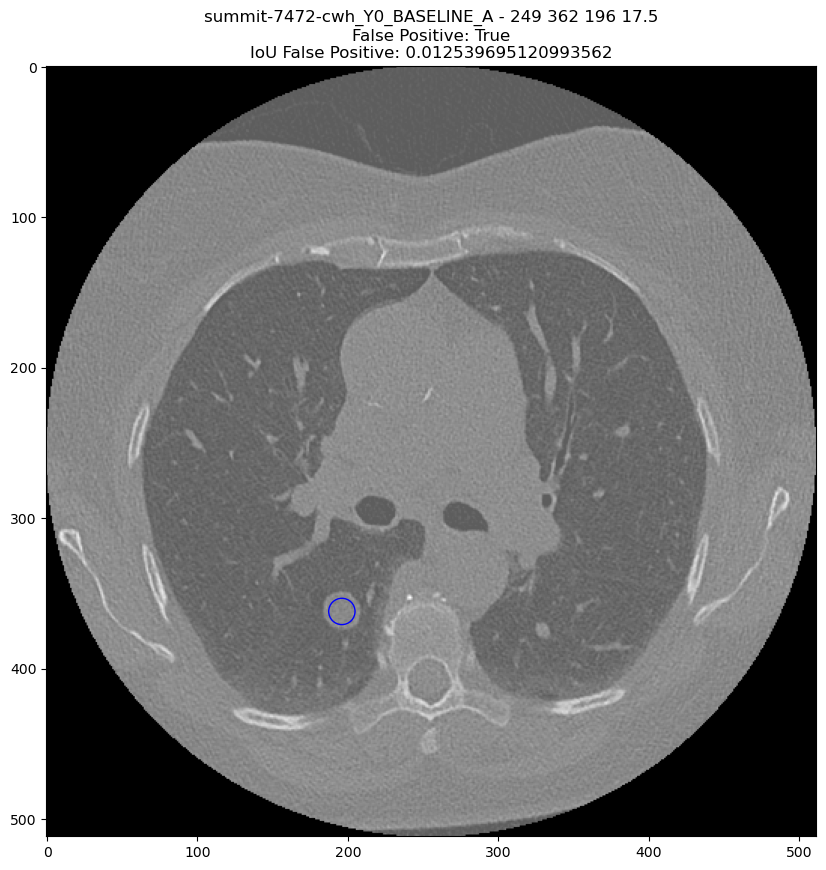

None
summit-4233-uaq_Y0_BASELINE_A - 392 261 187 9.4921875
False Positive: True
IoU False Positive: nan


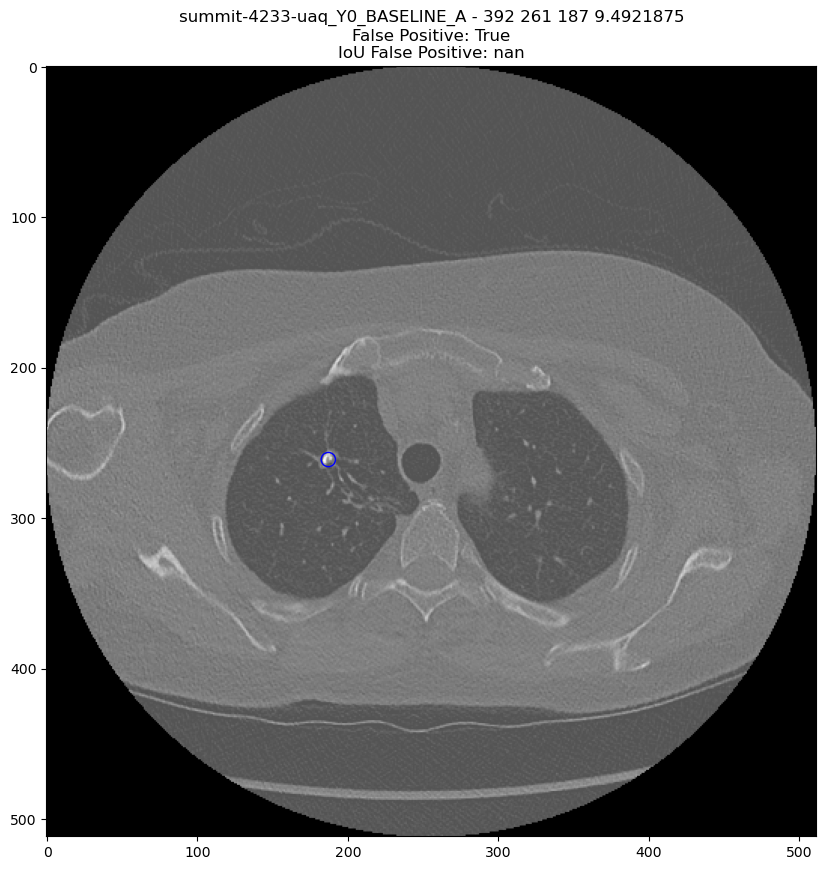

None
summit-3574-hbz_Y0_BASELINE_A - 306 344 190 8.0859375
False Positive: True
IoU False Positive: nan


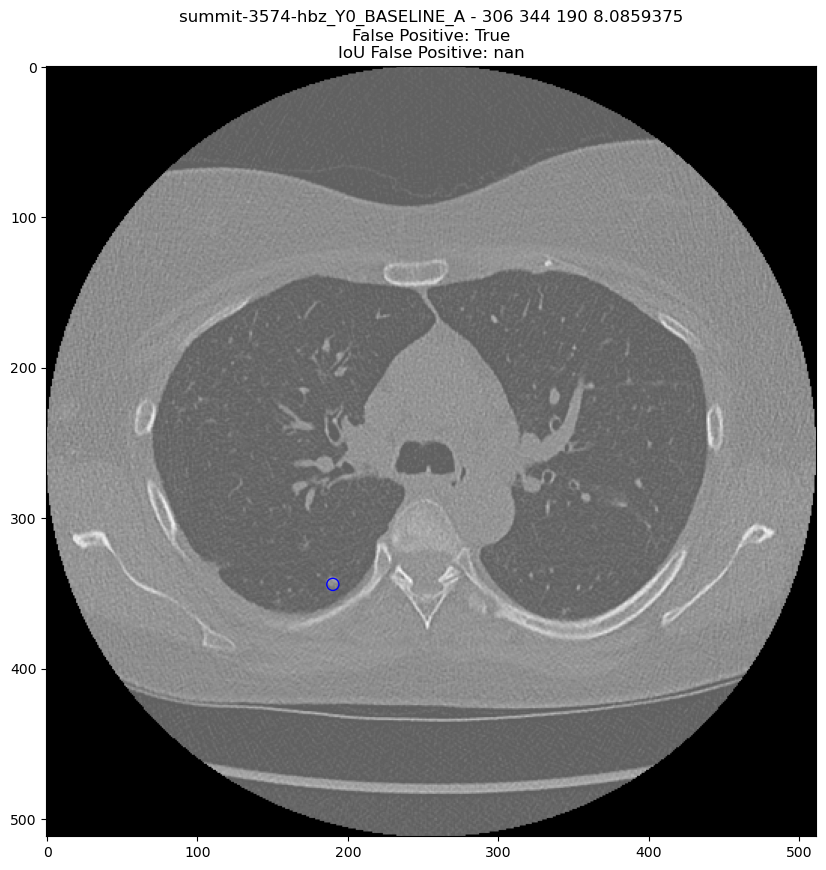

None
summit-6385-cyq_Y0_BASELINE_A - 228 353 421 4.53125
False Positive: True
IoU False Positive: 0.0


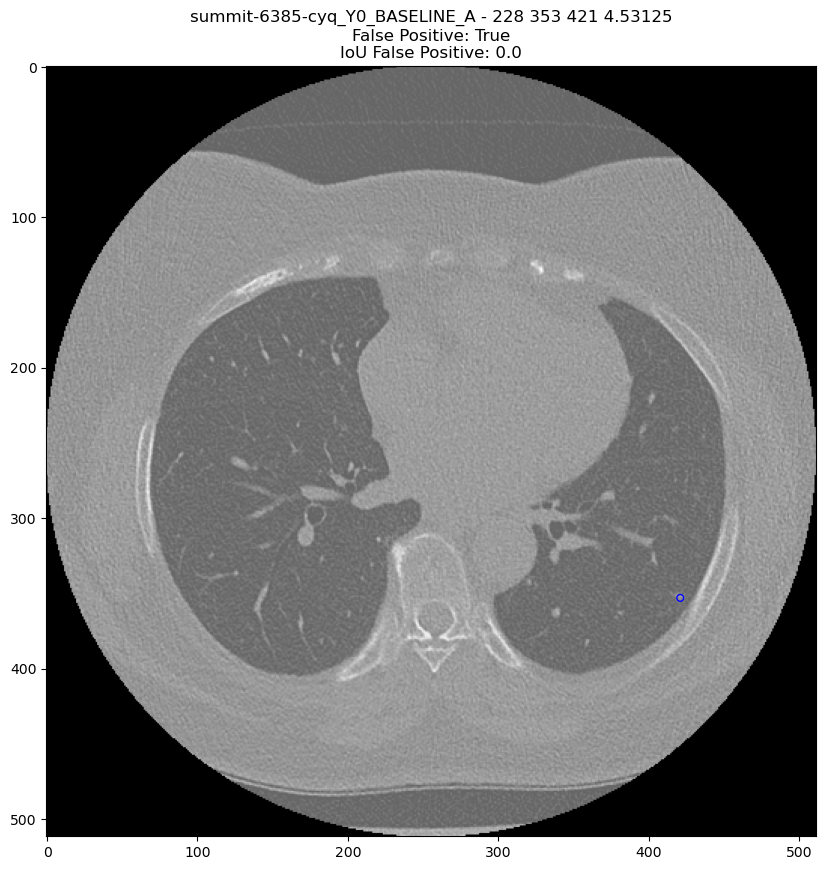

None
summit-7658-fzv_Y0_BASELINE_A - 363 302 154 4.53125
False Positive: True
IoU False Positive: nan


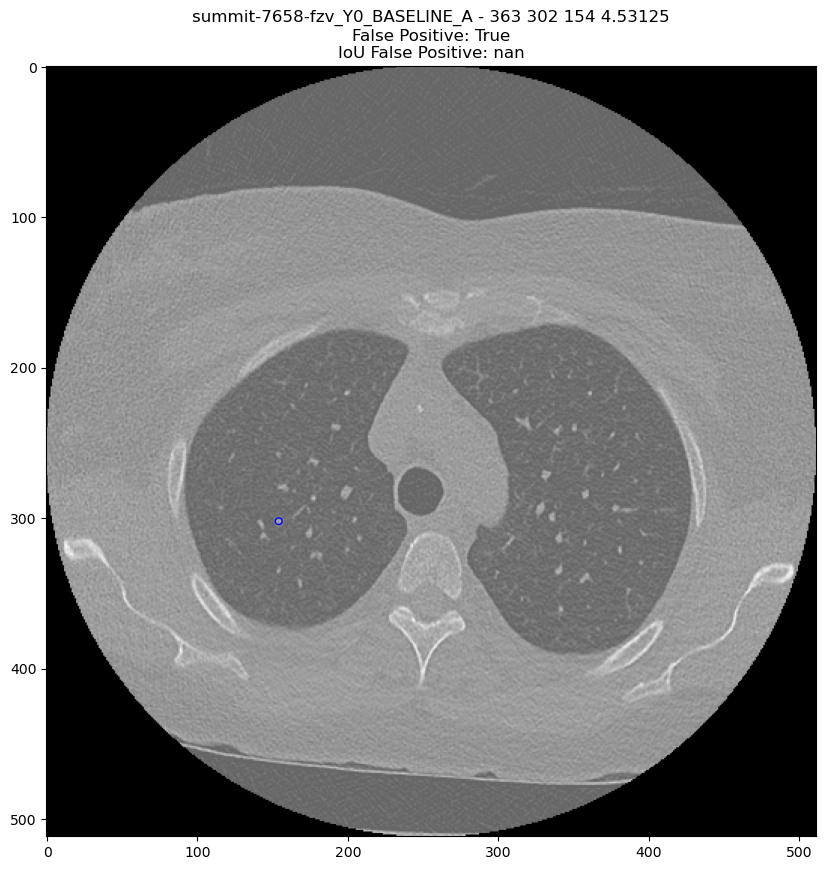

None
summit-4368-ndj_Y0_BASELINE_A - 449 325 168 6.328125
False Positive: True
IoU False Positive: 0.0


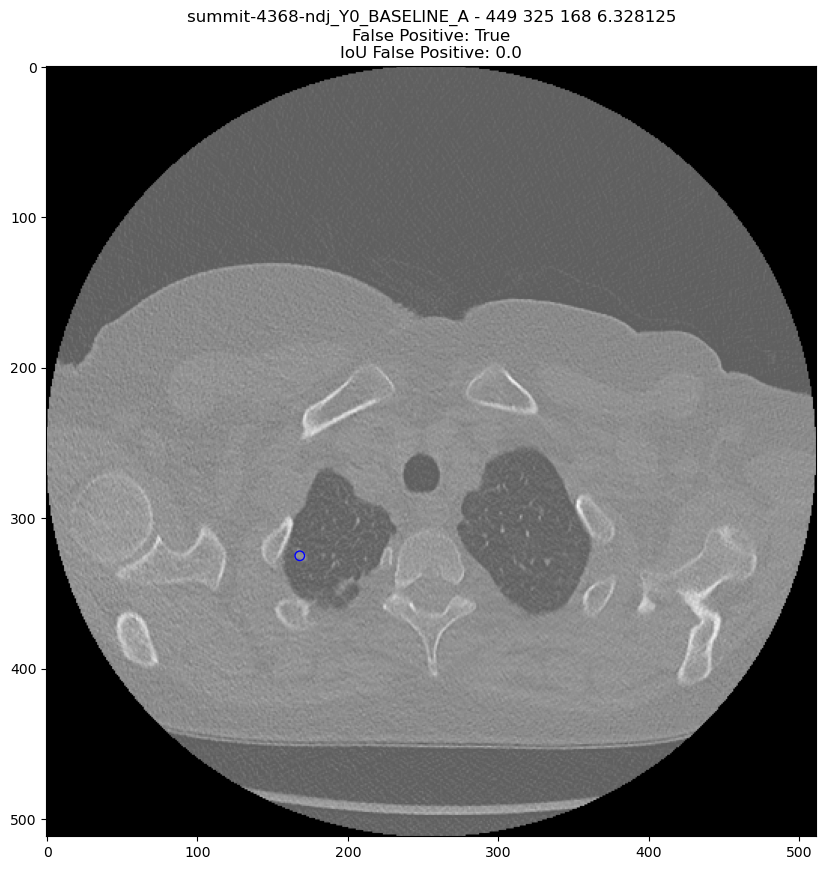

In [37]:
df = false_positives_fpps['0.125']

cnt = 0
for idx, row in df[df.distance_false_positive].sort_values(by='threshold', ascending=False).iterrows():
    scan_id = row['name']
    study_id = scan_id.split('_')[0]
    x = row['row']
    y = row['col']
    z = row['index']
    diameter = row['diameter']
    

    copy_scan_from_cluster(scan_id)
    
    scan = SummitScan.load_scan(f'{workspace_path}/data/summit/scans/{study_id}/{scan_id}.mhd')
    irc = xyz2irc([x, y, z], scan.origin, scan.voxel_size, scan.orientation)


    show_mhd_candidate_location(scan_id, scan.image, irc.row, irc.col, irc.index, diameter, row.distance_false_positive, row.iou_false_positive)
    cnt+=1
    if cnt == 12:
        break